In [1]:
#Library Used in all Code
import numpy as np
import pandas as pd

#Used In Rule of Mixtures
import pymatgen as pymat
import mendeleev as mendel

#Random
np.random.seed(44) # Random Seed1
import random

# PLOTTING (MATPLOTLIB)
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML

# PLOTTING (PLOTLY)
import plotly 
import plotly.graph_objs as go
from plotly.offline import iplot
plotly.offline.init_notebook_mode(connected=True)

# ML
from lolopy.learners import RandomForestRegressor

# Meltheas TOOL
from simtool import findInstalledSimToolNotebooks, searchForSimTool
from simtool import getSimToolInputs, getSimToolOutputs, Run

MeltHEA = searchForSimTool('meltheas')
from IPython.display import clear_output
from IPython.display import display
from hublib.ui import FileUpload
import ipywidgets as widgets
import os
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

<IPython.core.display.Javascript object>

# Import Initial Dataset 

In [2]:
#Get initial set for testing data
initial_data = pd.read_csv('NewSmallCompistionDataSet.csv')
initial_data = initial_data.drop(['Solid Tm'], axis=1)
initial_data = initial_data.drop(['Liquid Tm'], axis=1)
initial_data = initial_data.drop(['Minus'], axis=1)
initial_data = initial_data.drop(['Plus'], axis=1)
initial_data = initial_data.drop(['Unnamed: 0'], axis=1)
compared_df = initial_data.drop(['Simulated Tm'], axis=1)
#display(initial_data)

# All Plausible Compisition Creator

In [3]:
#Create lines to get values with .1 step size
nx = 11
x1 = np.linspace(0, 1, nx)
y, y1, y2, y3, y4 = np.meshgrid(x1, x1, x1, x1, x1)
positions = np.vstack([y.ravel(), y1.ravel(), y2.ravel(), y3.ravel(), y4.ravel()]).T

#Make dataframe with limits of all possible compistions combinations
all_permutations = pd.DataFrame(positions)
all_permutations["sum"]= all_permutations.sum(axis = 1)
plausible_compositions = all_permutations[all_permutations["sum"] == 1]

plausible_compositions = plausible_compositions[plausible_compositions[0] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[1] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[2] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[3] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[4] <= 0.5]

plausible_compositions = plausible_compositions.round(1)

plausible_compositions = plausible_compositions.drop(["sum"], axis = 1)
initial_plausible_compositions = plausible_compositions
#display(plausible_compositions)

# Apply Rule of Mixtures to Compositions

In [4]:
#string to select characteristics
actual_qued_values = ['youngs_modulus', 'atomic_radius', 'electrical_resistivity','CTE','hardness','boiling_point',
                         'atomic_mass','poissons_ratio','density_of_solid','en_gosh','melting_point']

sample = ['Cr', 'Co', 'Cu', 'Fe', 'Ni']

def get_discriptors(input_string,sample):
    #dictionary values to choose from
    string_dict = ['bulk_modulus','youngs_modulus','CTE','thermal_conductivity','boiling_point','critical_temperature',
                  'vdw_radius','average_ionic_radius','atomic_radius','atomic_number','atomic_mass','molar_volume', 
                   'density_of_solid','hardness','poissons_ratio','period','group','en_gosh','electrical_resistivity', 'melting_point']

    #Creation of dictionary
    data_set = {}

    #Make dict of lists
    for length_string in range(len(string_dict)):
        data_set[string_dict[length_string]] = []

    #all plausbile compositions from before
    df2 = plausible_compositions

    #list of all things
    que_values = []

    for item in sample:
        element_object = pymat.Element(item)
        data_set[string_dict[0]].append(element_object.bulk_modulus) #bulk_modulus
        data_set[string_dict[1]].append(element_object.youngs_modulus) #youngs_modulus
        data_set[string_dict[2]].append(element_object.coefficient_of_linear_thermal_expansion) #CTE
        data_set[string_dict[3]].append(element_object.thermal_conductivity) #thermal conductivity
        data_set[string_dict[4]].append(element_object.boiling_point) #boiling_point
        data_set[string_dict[5]].append(element_object.critical_temperature) #critical temperature
        data_set[string_dict[6]].append(element_object.van_der_waals_radius) #vander wall radius
        data_set[string_dict[7]].append(element_object.average_ionic_radius) #average ionic radius
        data_set[string_dict[8]].append(element_object.atomic_radius) #atomic radius
        data_set[string_dict[9]].append(element_object.Z) #atomic number
        data_set[string_dict[10]].append(element_object.atomic_mass) #atomic mass
        data_set[string_dict[11]].append(element_object.molar_volume) #molar volume
        data_set[string_dict[12]].append(element_object.density_of_solid) #density_solid
        data_set[string_dict[13]].append(element_object.brinell_hardness) #brinell_hardness
        data_set[string_dict[14]].append(element_object.poissons_ratio) #poissons_ratio
        data_set[string_dict[15]].append(element_object.row) #period
        data_set[string_dict[16]].append(element_object.group) #group
        data_set[string_dict[17]].append(element_object.X) #en_gosh
        data_set[string_dict[18]].append(element_object.electrical_resistivity) #electrical_resistivity
        data_set[string_dict[19]].append(element_object.melting_point) #melting_point

    for discript in input_string:
        que_values.append(data_set[discript])

    df = pd.DataFrame(data = que_values, columns = sample, index = input_string) 
    display(df)
    return df

discriptors_df = get_discriptors(actual_qued_values,sample)

,Cr,Co,Cu,Fe,Ni
youngs_modulus,2.790000e+02,2.090000e+02,1.300000e+02,2.110000e+02,2.000000e+02
atomic_radius,1.400000e+00,1.350000e+00,1.350000e+00,1.400000e+00,1.350000e+00
electrical_resistivity,1.270000e-07,6.000000e-08,1.720000e-08,1.000000e-07,7.200000e-08
CTE,4.900000e-06,1.300000e-05,1.650000e-05,1.180000e-05,1.340000e-05
hardness,1.120000e+03,7.000000e+02,8.740000e+02,4.900000e+02,7.000000e+02
boiling_point,2.944000e+03,3.200000e+03,3.200000e+03,3.134000e+03,3.186000e+03
atomic_mass,5.199610e+01,5.893319e+01,6.354600e+01,5.584500e+01,5.869340e+01
poissons_ratio,2.100000e-01,3.100000e-01,3.400000e-01,2.900000e-01,3.100000e-01
density_of_solid,7.140000e+03,8.900000e+03,8.920000e+03,7.874000e+03,8.908000e+03
en_gosh,1.660000e+00,1.880000e+00,1.900000e+00,1.830000e+00,1.910000e+00


In [ ]:
#Rename df to match other dataframes
plausible_compositions = plausible_compositions.rename(columns = {0:'Cr',1:'Co',2:'Cu',3:'Fe', 4:'Ni'})

#Taking out replicas
df = pd.merge(plausible_compositions, compared_df, how='left', indicator = 'Exsist')
df = df[df['Exsist'] != 'both']
plausible_compositions = df.drop(['Exsist'], axis = 1)

#display(plausible_compositions)

# Applying Rule of Mixture

In [ ]:
#Applu Rule of Mixtures
def rule_mixtures(df2,df,sample): 
    #Creator column of first rule mixture discriptor to concat to
    cr = 0
    for comps in sample:
        cr = cr+df2[comps]*df[comps][0]
    cr = cr.to_frame()

    #Concat rest of compistions with rule of mixtures applied
    for x in range(1,len(actual_qued_values)):
        cf = 0
        for comps in sample:
            cf = cf + df2[comps]*df[comps][x]
        cf.to_frame()
        cr = pd.concat([cr,cf], axis=1)

    #Renames columns to discriptors
    cr.columns = actual_qued_values
    return cr

plausible_compositions_rule_mixtures = rule_mixtures(plausible_compositions,discriptors_df,sample)
known_compositions_rule_mixtures = rule_mixtures(compared_df,discriptors_df,sample)
#display(plausible_compositions_rule_mixtures)

# Data Preperation

In [ ]:
#Concatinate values
all_rule_mixtures = pd.concat([known_compositions_rule_mixtures,plausible_compositions_rule_mixtures])
all_compositions = pd.concat([compared_df,plausible_compositions])

#Experimental melting temperatures [K]
T_m_Cr = 2180
T_m_Co = 1768
T_m_Cu = 1358
T_m_Fe = 1811
T_m_Ni = 1728

#display(all_compositions)

In [ ]:
#Set testing and training data
all_values = all_rule_mixtures.values.tolist()
all_labels = initial_data['Simulated Tm'].tolist()

# List of lists are turned into Numpy arrays to facilitate calculations in steps to follow (Normalization).
all_values = np.array(all_values, dtype = float)
all_labels = np.array(all_labels, dtype = float)

create_label = np.zeros((plausible_compositions_rule_mixtures.shape[0],), dtype = int)
all_labels = np.concatenate((all_labels,create_label), axis = 0)
#display(all_compositions)

# Getting CSVS for Sequential Learning

In [ ]:
import glob
import os
import os.path, time

list_seq_learn = []

#path = '/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/'
path = os.getcwd()

print(path)

list_of_files = sorted(os.listdir(path), key=os.path.getctime)
for docs in list_of_files:
    if 'melting_8labels' in docs:
        list_seq_learn.append(docs)
print(list_seq_learn)

/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/200picoRuns_RandomSeeds/MU_datasetCreatorForPaper
['MU_melting_8labels50pico0.csv', 'MU_melting_8labels50pico1.csv', 'MU_melting_8labels50pico2.csv', 'MU_melting_8labels50pico3.csv', 'MU_melting_8labels50pico4.csv', 'MU_melting_8labels200pico4.csv', 'MU_melting_8labels50pico6.csv', 'MU_melting_8labels200pico6.csv']


# Random Forest Creation and Prediction

In [ ]:
X = all_values.copy() #discriptors
y = all_labels.copy() #all labels  

# assign values
model = RandomForestRegressor(num_trees = 350) #model if iterate through
#print(model.__init__)

entry_number_init = initial_data.shape[0] #starting point of initial data
in_train = np.zeros(len(X), dtype=np.bool) #make all false

in_train[:entry_number_init] = True #turns false to true 

#in_train[np.where(y!=0)] = True

print('Picked {} training entries'.format(in_train.sum()))

nsamples = in_train.sum()
train_fraction = 0.8
train_idx = int(train_fraction*nsamples)

print (X.shape, y.shape)


#Get previous runs of sequential and use them
if list_seq_learn:
    y_counter = 0
    seq_learn_data = pd.read_csv(list_seq_learn[-1])
    for val in seq_learn_data['Index']:
        in_train[val] = True
        y[val] = seq_learn_data['Simulated Tm'][y_counter]
        y_counter = y_counter + 1
    
    

# Uncomment the line below to shuffle the dataset (we do not do this here to ensure consistent results for every run)
#order = np.argsort(np.random.random(all_labels.shape)) # This numpy argsort returns the indexes that would be used to shuffle a list
#order = np.arange(nsamples)
#all_values = all_values[0:nsamples][order]
#all_labels = all_labels[0:nsamples][order]

model.fit(X[:train_idx, :], y[:train_idx])
test_pred, test_std = model.predict(X[train_idx:nsamples, :], return_std=True)
pred, std = model.predict(X, return_std=True)
#print(in_train)

Picked 39 training entries
(593, 11) (593,)


In [ ]:
import plotly
import plotly.graph_objs as go
from plotly.offline import iplot

layout0= go.Layout(title= "Melting Temperature", hovermode= 'closest',
    xaxis= dict(title= 'Real Values',zeroline= False, gridwidth= 2),
    yaxis= dict(title= 'Predictions',zeroline= False, gridwidth= 2), height=800, width=800, font=dict(size=22))

testing= go.Scatter(x = y[train_idx:nsamples], y = test_pred, mode = 'markers', marker= dict(size= 14, color= 'red', symbol = 'x'), 
                    name= "Testing Data", error_y=dict(type='data', array=test_std,visible=True))
everything = go.Scatter(x = y[:nsamples], y = pred, mode = 'markers', marker= dict(size= 14, color= 'blue', symbol = 'x'), 
                        name= "All Data", error_y=dict(type='data', array=std,visible=True))
match = go.Scatter(x = [1700,2300], y = [1700,2300], mode = 'lines', name = "Match", line= dict( color = 'black', dash='dash'))

traces = [everything,testing,match]
fig= go.Figure(traces, layout=layout0)
fig.update_yaxes(automargin=True)
iplot(fig)
#print(model.__dict__)

# Applying Acquisition Function

65
-------------------------------------------------------------
Experiment #  0
539
[0.4, 0.4, 0.2, 0.0, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9cb13f61abb747578f8845b842ddbd12/inputs.yaml
       RUNS/9cb13f61abb747578f8845b842ddbd12
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9cb13f61abb747578f8845b842ddbd12/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:22:05<00:00, 197.01s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9cb13f61abb747578f8845b842ddbd12/inputs.yaml
       RUNS/9cb13f61abb747578f8845b842ddbd12
Predicted melting temperature for this potential:  2070.1216624219724
95% confidence interval:  1.40499055573903
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.98828125
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.200e+01 2.000e+00 3.300e+01 1.000e+00 4.554e+03 4.608e+03]


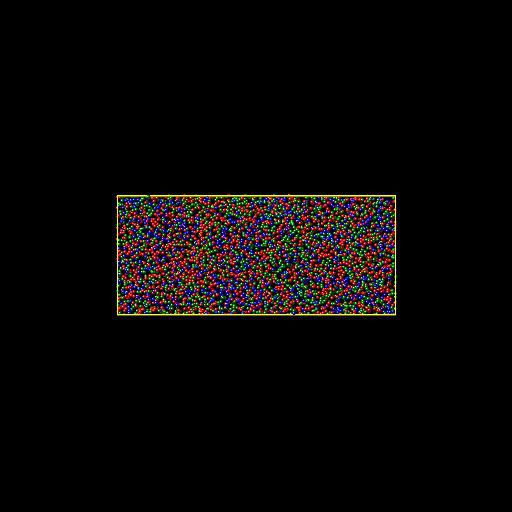

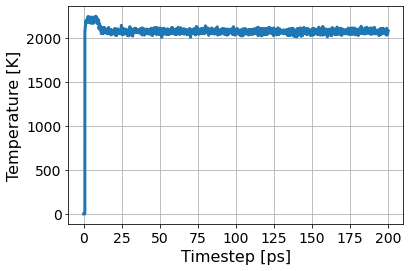

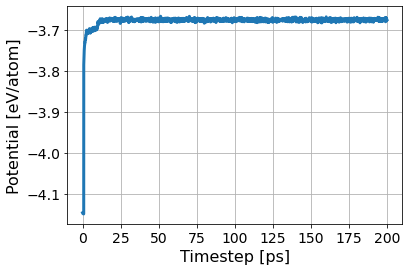

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/47d71bc8b4d74f3fa7ec93be136514ef/inputs.yaml
       RUNS/47d71bc8b4d74f3fa7ec93be136514ef
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/47d71bc8b4d74f3fa7ec93be136514ef/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:21:26<00:00, 195.47s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/47d71bc8b4d74f3fa7ec93be136514ef/inputs.yaml
       RUNS/47d71bc8b4d74f3fa7ec93be136514ef
Predicted melting temperature for this potential:  1920.7102501872657
95% confidence interval:  1.278610314517025
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9915364583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.600e+01 1.000e+00 1.600e+01 1.000e+00 4.569e+03 4.608e+03]


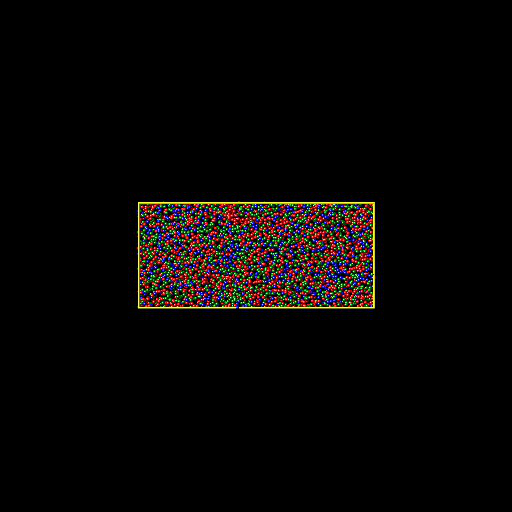

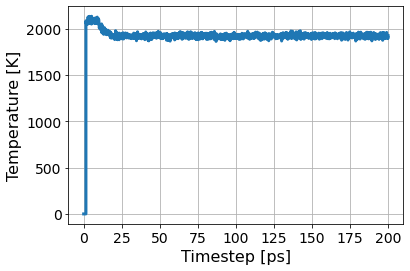

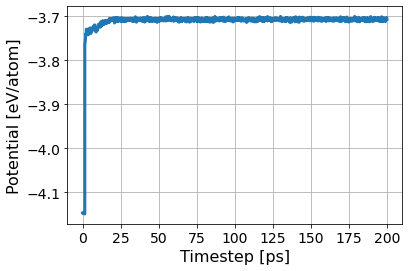

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/49ccbfcc279440a5a97f831b7c6f0ff6/inputs.yaml
       RUNS/49ccbfcc279440a5a97f831b7c6f0ff6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/49ccbfcc279440a5a97f831b7c6f0ff6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:30<00:00, 188.43s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/49ccbfcc279440a5a97f831b7c6f0ff6/inputs.yaml
       RUNS/49ccbfcc279440a5a97f831b7c6f0ff6
Predicted melting temperature for this potential:  1815.961836953808
95% confidence interval:  1.2235653692366966
Fraction of system solid:  0.002170138888888889
Fraction of system liquid:  0.9869791666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+01 2.600e+01 1.000e+00 2.300e+01 0.000e+00 4.548e+03 4.608e+03]


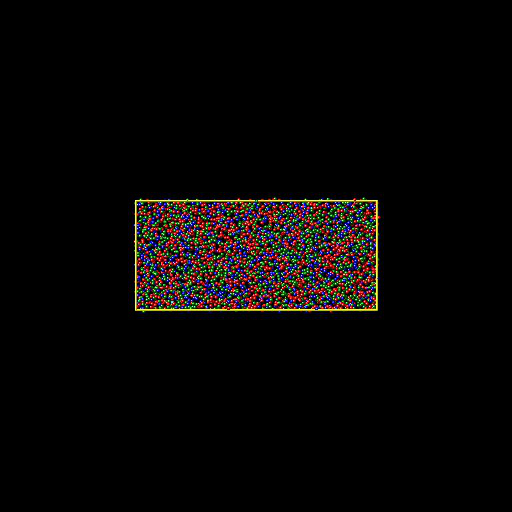

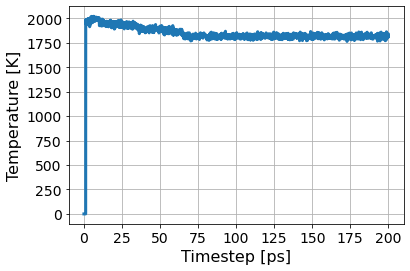

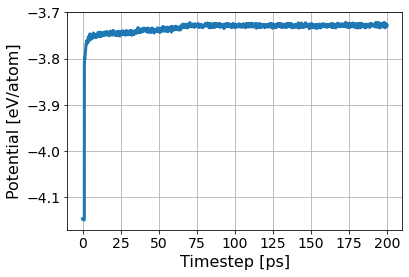

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9a99f5a35a1943f280c4d6306e6b36f4/inputs.yaml
       RUNS/9a99f5a35a1943f280c4d6306e6b36f4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9a99f5a35a1943f280c4d6306e6b36f4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:51<00:00, 186.87s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9a99f5a35a1943f280c4d6306e6b36f4/inputs.yaml
       RUNS/9a99f5a35a1943f280c4d6306e6b36f4
Predicted melting temperature for this potential:  1878.6477377028716
95% confidence interval:  1.2959570835010539
Fraction of system solid:  0.3309461805555556
Fraction of system liquid:  0.6529947916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1525.   51.   16.    7.    0. 3009. 4608.]


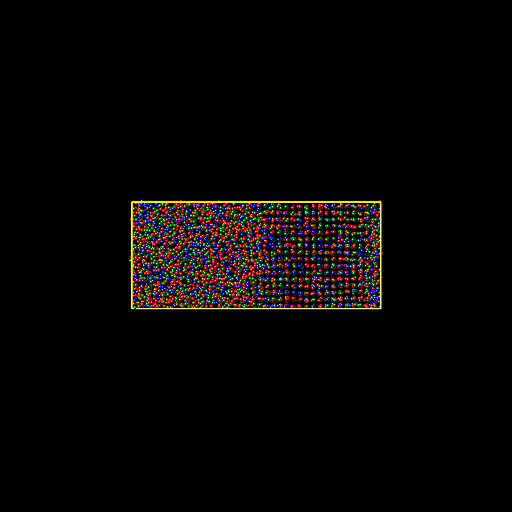

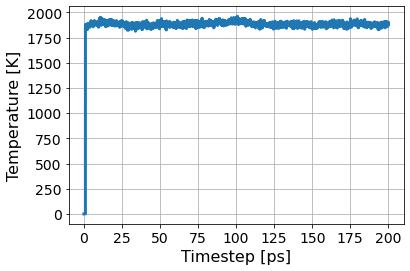

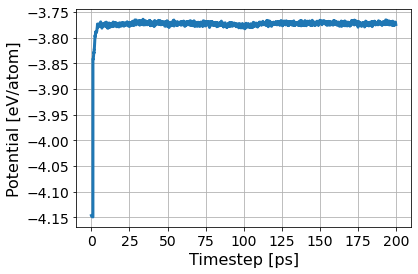

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a02d06413733403b902437094bafc3e7/inputs.yaml
       RUNS/a02d06413733403b902437094bafc3e7
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a02d06413733403b902437094bafc3e7/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:16<00:00, 187.85s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a02d06413733403b902437094bafc3e7/inputs.yaml
       RUNS/a02d06413733403b902437094bafc3e7
Predicted melting temperature for this potential:  1875.5612400749064
95% confidence interval:  1.3766648236377224
Fraction of system solid:  0.5668402777777778
Fraction of system liquid:  0.4103732638888889
Simulation Success Flag 1.0
Crystal Structure Info:  [2612.   65.   35.    5.    0. 1891. 4608.]


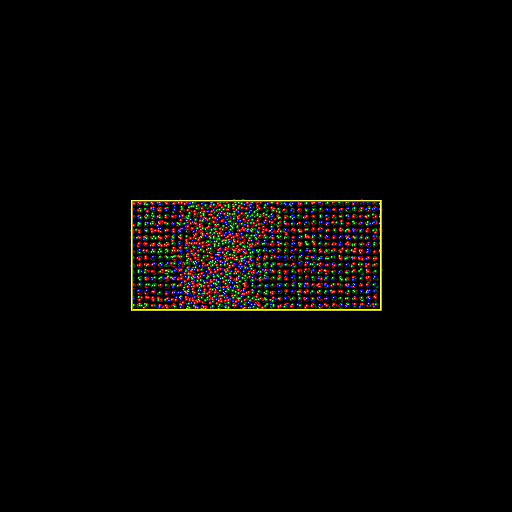

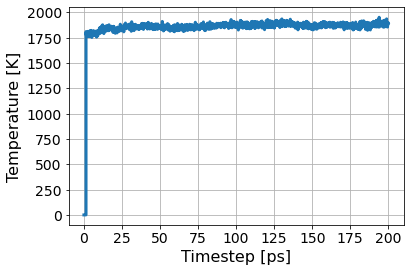

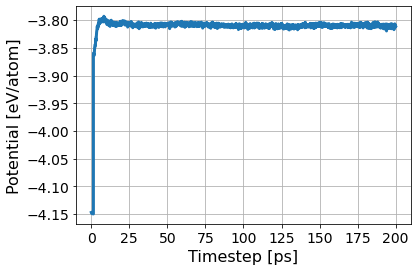

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  1
472
[0.5, 0.3, 0.2, 0.0, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/60de819b1f164d30ba40d31d4afe48f3/inputs.yaml
       RUNS/60de819b1f164d30ba40d31d4afe48f3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/60de819b1f164d30ba40d31d4afe48f3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:53<00:00, 184.55s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/60de819b1f164d30ba40d31d4afe48f3/inputs.yaml
       RUNS/60de819b1f164d30ba40d31d4afe48f3
Predicted melting temperature for this potential:  2142.887181523096
95% confidence interval:  1.3812155024567108
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9932725694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.100e+01 2.000e+00 1.100e+01 1.000e+00 4.577e+03 4.608e+03]


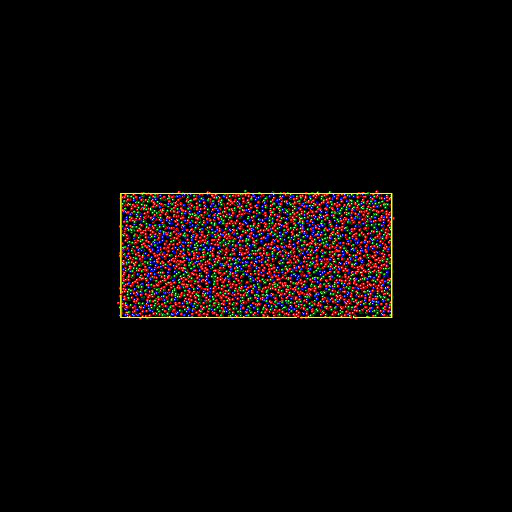

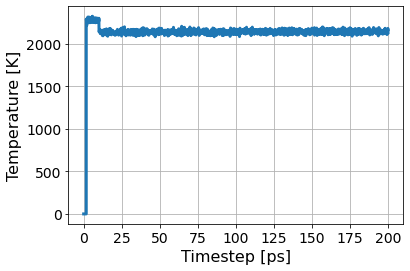

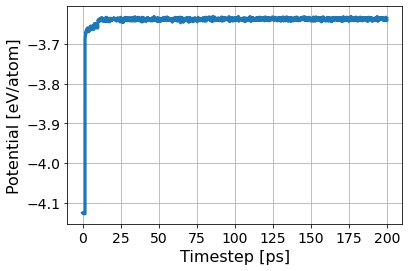

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0d1ccdd670c5495b997d55be5b1ad84d/inputs.yaml
       RUNS/0d1ccdd670c5495b997d55be5b1ad84d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0d1ccdd670c5495b997d55be5b1ad84d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:02<00:00, 187.30s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0d1ccdd670c5495b997d55be5b1ad84d/inputs.yaml
       RUNS/0d1ccdd670c5495b997d55be5b1ad84d
Predicted melting temperature for this potential:  2030.75293670412
95% confidence interval:  1.3704784775166148
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.990234375
Simulation Success Flag 0.0
Crystal Structure Info:  [   6.   21.    0.   18.    0. 4563. 4608.]


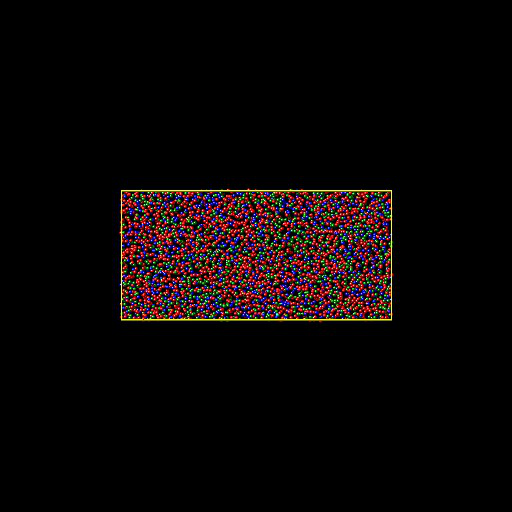

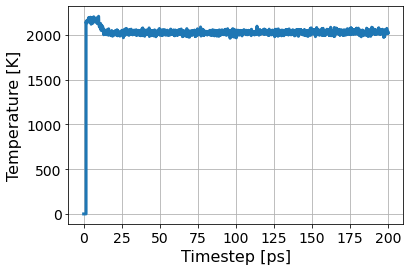

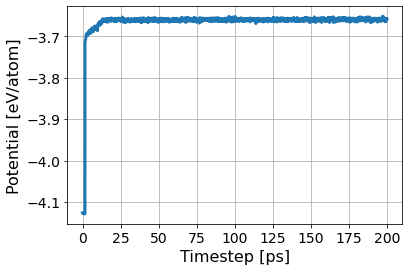

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4d6e1a90597949bdb88760eed1f6f138/inputs.yaml
       RUNS/4d6e1a90597949bdb88760eed1f6f138
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4d6e1a90597949bdb88760eed1f6f138/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:18<00:00, 190.35s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4d6e1a90597949bdb88760eed1f6f138/inputs.yaml
       RUNS/4d6e1a90597949bdb88760eed1f6f138
Predicted melting temperature for this potential:  1906.3999986267165
95% confidence interval:  1.2503754542032646
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9887152777777778
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.000e+01 0.000e+00 2.900e+01 0.000e+00 4.556e+03 4.608e+03]


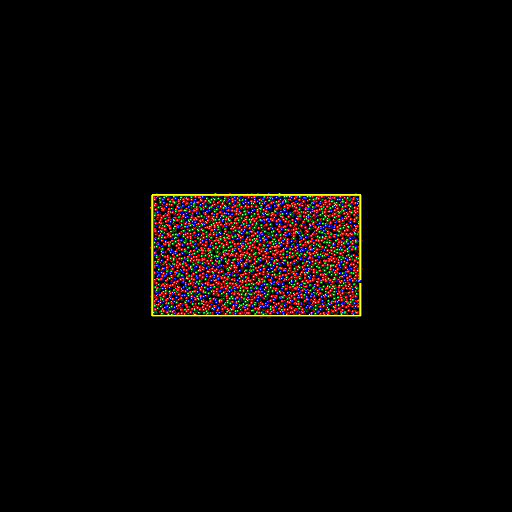

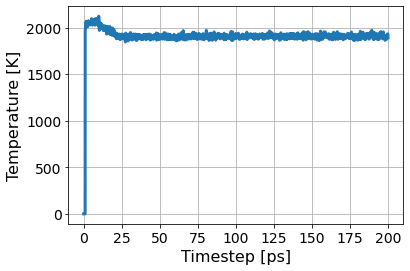

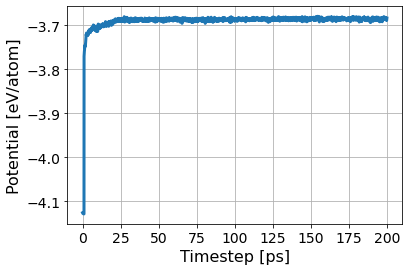

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6aa0dee087ed432fbbc5cc7ac4372f23/inputs.yaml
       RUNS/6aa0dee087ed432fbbc5cc7ac4372f23
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6aa0dee087ed432fbbc5cc7ac4372f23/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:26<00:00, 190.67s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6aa0dee087ed432fbbc5cc7ac4372f23/inputs.yaml
       RUNS/6aa0dee087ed432fbbc5cc7ac4372f23
Predicted melting temperature for this potential:  1783.6499637952559
95% confidence interval:  1.1534542418863294
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 2.900e+01 0.000e+00 3.300e+01 0.000e+00 4.544e+03 4.608e+03]


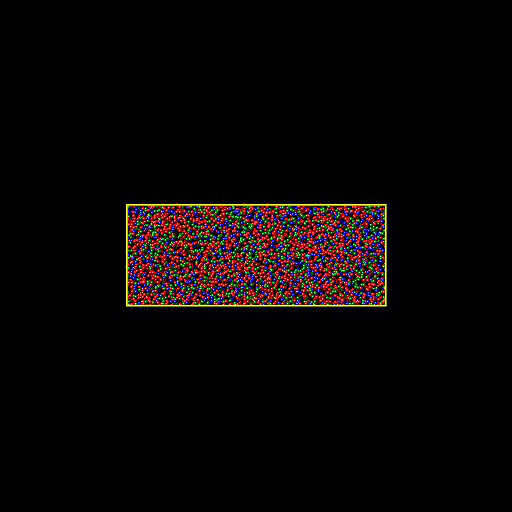

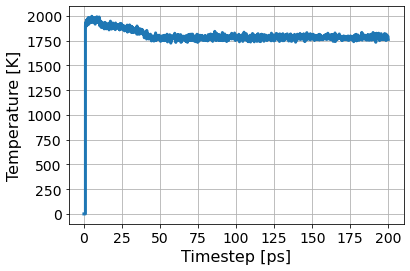

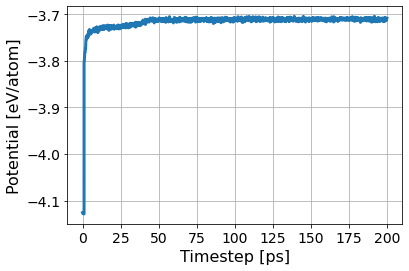

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/73b5d2d55a8044d9907bbcee52037a3c/inputs.yaml
       RUNS/73b5d2d55a8044d9907bbcee52037a3c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/73b5d2d55a8044d9907bbcee52037a3c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:10<00:00, 185.23s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/73b5d2d55a8044d9907bbcee52037a3c/inputs.yaml
       RUNS/73b5d2d55a8044d9907bbcee52037a3c
Predicted melting temperature for this potential:  1836.7190836454433
95% confidence interval:  1.373063020967262
Fraction of system solid:  0.3459201388888889
Fraction of system liquid:  0.6384548611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1594.   45.   18.    9.    0. 2942. 4608.]


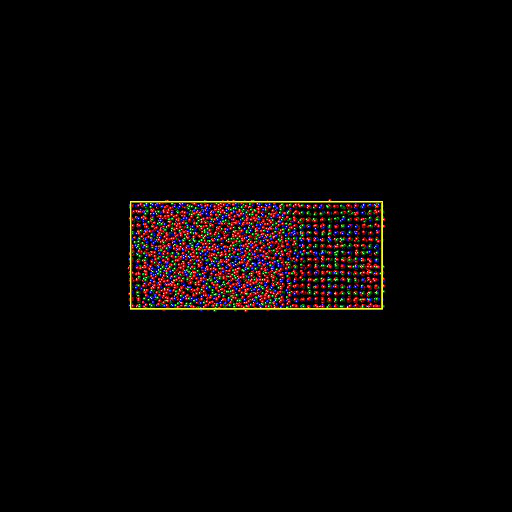

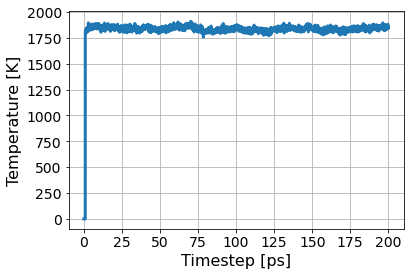

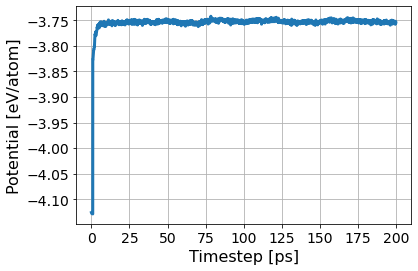

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7c89504ea3a9422a9522a9fbe1b18756/inputs.yaml
       RUNS/7c89504ea3a9422a9522a9fbe1b18756
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7c89504ea3a9422a9522a9fbe1b18756/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:18<00:00, 185.54s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7c89504ea3a9422a9522a9fbe1b18756/inputs.yaml
       RUNS/7c89504ea3a9422a9522a9fbe1b18756
Predicted melting temperature for this potential:  1844.1886047440698
95% confidence interval:  1.4113518539497583
Fraction of system solid:  0.5390625
Fraction of system liquid:  0.4370659722222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2484.   69.   34.    7.    0. 2014. 4608.]


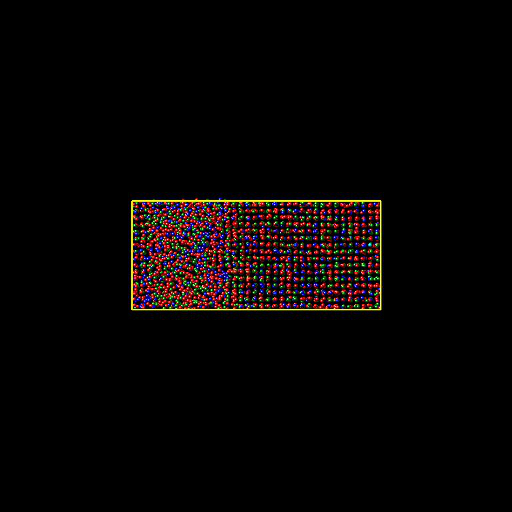

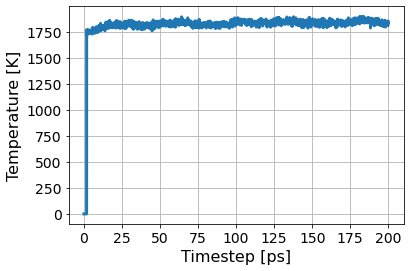

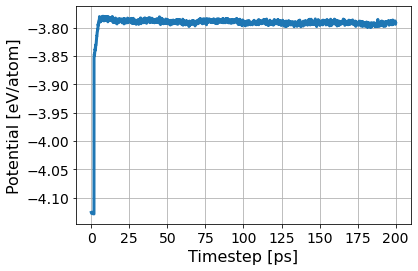

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  2
294
[0.5, 0.1, 0.2, 0.2, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/22ad2aee4931471d99f030cb3a3a46f6/inputs.yaml
       RUNS/22ad2aee4931471d99f030cb3a3a46f6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/22ad2aee4931471d99f030cb3a3a46f6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:36<00:00, 188.67s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/22ad2aee4931471d99f030cb3a3a46f6/inputs.yaml
       RUNS/22ad2aee4931471d99f030cb3a3a46f6
Predicted melting temperature for this potential:  2053.1185908863918
95% confidence interval:  1.3825630680983658
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.9895833333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 1.800e+01 2.000e+00 2.600e+01 1.000e+00 4.560e+03 4.608e+03]


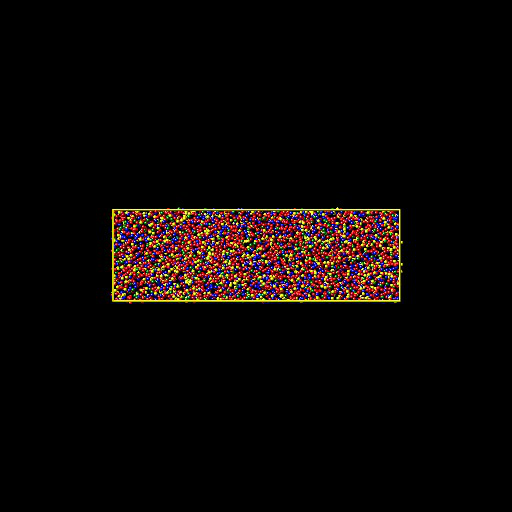

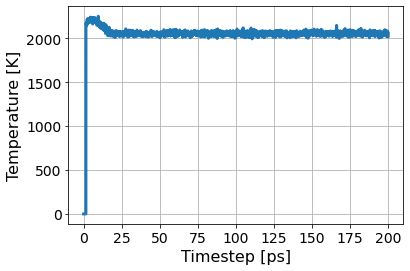

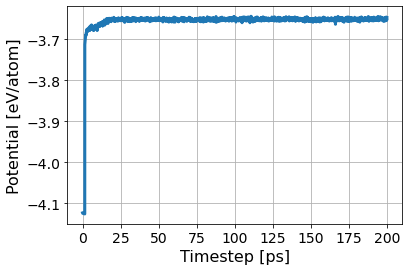

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/68d044f0cd53453db7028d6d4bc68c0f/inputs.yaml
       RUNS/68d044f0cd53453db7028d6d4bc68c0f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/68d044f0cd53453db7028d6d4bc68c0f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:32<00:00, 188.51s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/68d044f0cd53453db7028d6d4bc68c0f/inputs.yaml
       RUNS/68d044f0cd53453db7028d6d4bc68c0f
Predicted melting temperature for this potential:  1948.9151496878899
95% confidence interval:  1.3065518592319294
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9871961805555556
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 1.900e+01 1.000e+00 3.600e+01 0.000e+00 4.549e+03 4.608e+03]


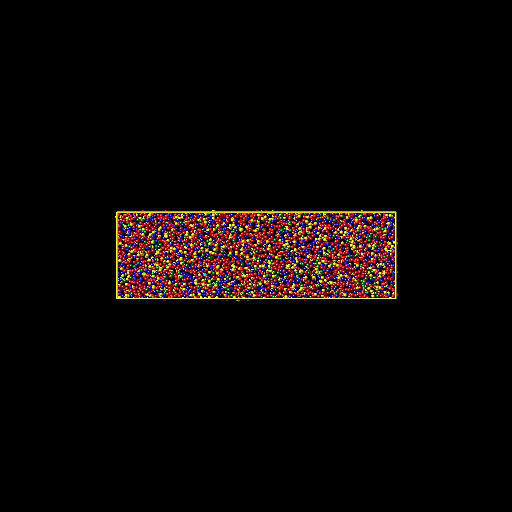

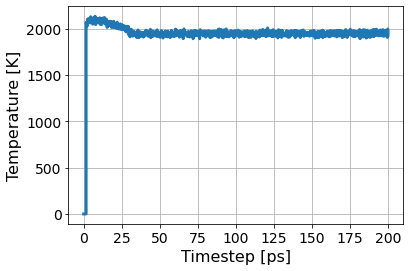

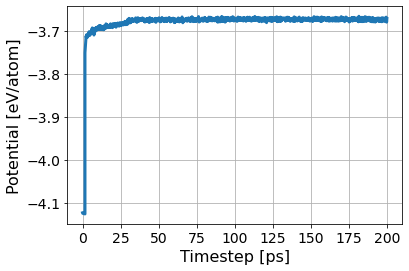

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/26fc7d0b6f404697acf424472fbb32b6/inputs.yaml
       RUNS/26fc7d0b6f404697acf424472fbb32b6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/26fc7d0b6f404697acf424472fbb32b6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:25<00:00, 190.63s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/26fc7d0b6f404697acf424472fbb32b6/inputs.yaml
       RUNS/26fc7d0b6f404697acf424472fbb32b6
Predicted melting temperature for this potential:  1969.8354484394504
95% confidence interval:  1.4378152245926175
Fraction of system solid:  0.3122829861111111
Fraction of system liquid:  0.6686197916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1439.   58.   16.   14.    0. 3081. 4608.]


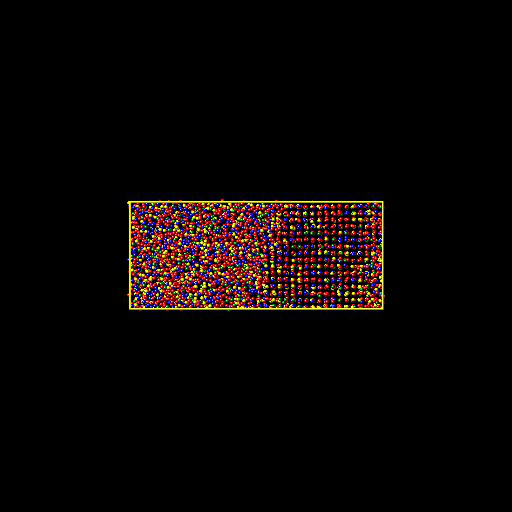

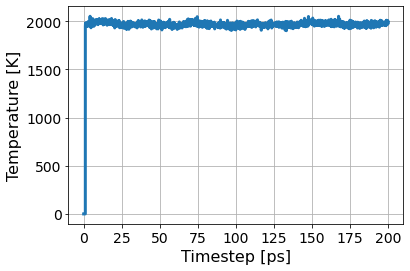

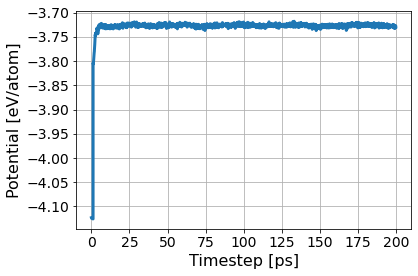

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/998de178e4324f539111ea9f51031d78/inputs.yaml
       RUNS/998de178e4324f539111ea9f51031d78
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/998de178e4324f539111ea9f51031d78/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:38<00:00, 193.55s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/998de178e4324f539111ea9f51031d78/inputs.yaml
       RUNS/998de178e4324f539111ea9f51031d78
Predicted melting temperature for this potential:  1938.7726536828964
95% confidence interval:  1.5691940974190202
Fraction of system solid:  0.4626736111111111
Fraction of system liquid:  0.5203993055555556
Simulation Success Flag 1.0
Crystal Structure Info:  [2.132e+03 5.100e+01 1.500e+01 1.000e+01 2.000e+00 2.398e+03 4.608e+03]


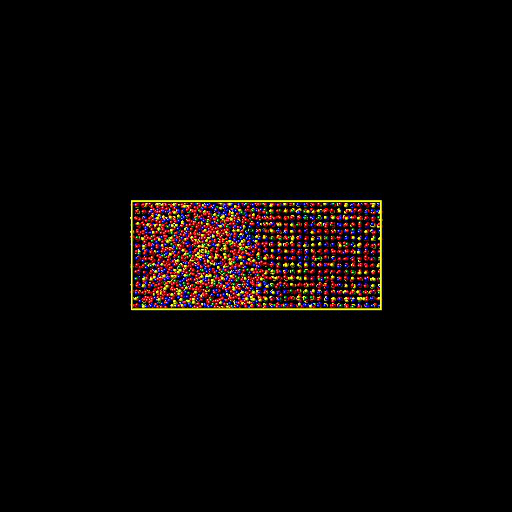

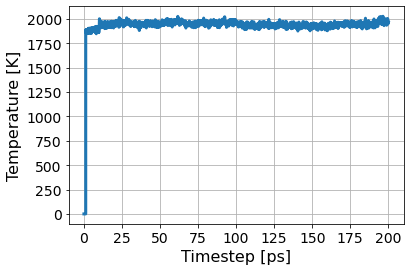

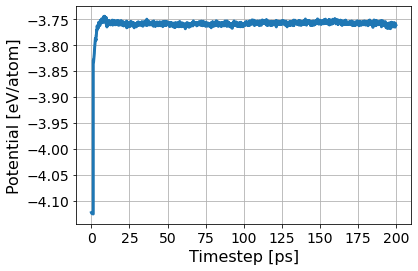

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  3
148
[0.4, 0.0, 0.2, 0.2, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/71bfb0bbb5d6471a8b4784888aca4083/inputs.yaml
       RUNS/71bfb0bbb5d6471a8b4784888aca4083
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/71bfb0bbb5d6471a8b4784888aca4083/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:21:27<00:00, 195.49s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/71bfb0bbb5d6471a8b4784888aca4083/inputs.yaml
       RUNS/71bfb0bbb5d6471a8b4784888aca4083
Predicted melting temperature for this potential:  2089.7784665418226
95% confidence interval:  1.4137323818200584
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9906684027777778
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.000e+01 2.000e+00 1.700e+01 0.000e+00 4.565e+03 4.608e+03]


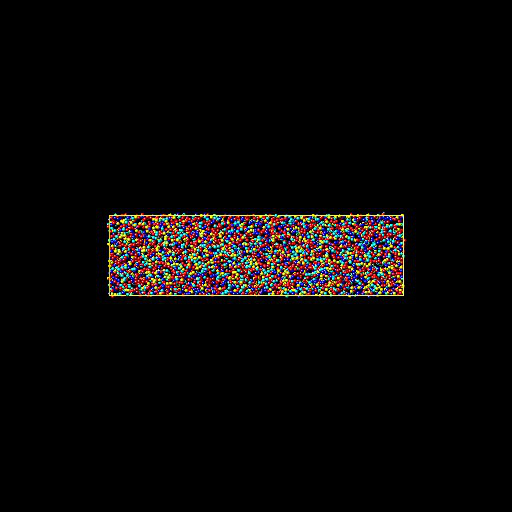

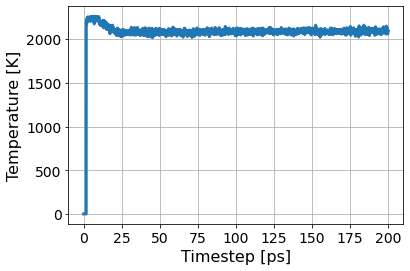

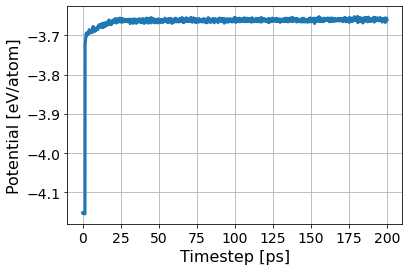

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/17991ef68e834d9c8b0d42148b622944/inputs.yaml
       RUNS/17991ef68e834d9c8b0d42148b622944
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/17991ef68e834d9c8b0d42148b622944/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:22:26<00:00, 197.88s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/17991ef68e834d9c8b0d42148b622944/inputs.yaml
       RUNS/17991ef68e834d9c8b0d42148b622944
Predicted melting temperature for this potential:  1964.3795518102374
95% confidence interval:  1.2778100963747556
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9869791666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [   5.   26.    0.   29.    0. 4548. 4608.]


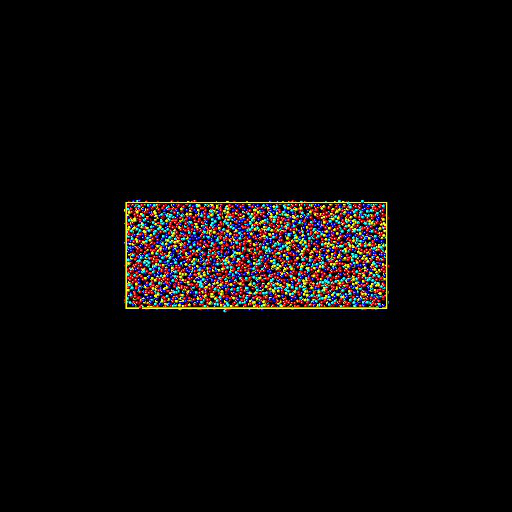

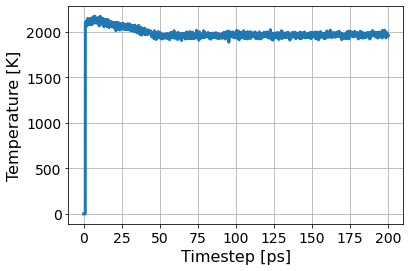

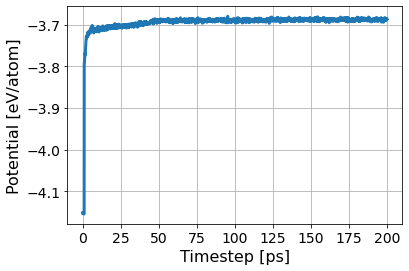

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d213768d097f4f9290c2aef75d6147d1/inputs.yaml
       RUNS/d213768d097f4f9290c2aef75d6147d1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d213768d097f4f9290c2aef75d6147d1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:21:06<00:00, 194.68s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d213768d097f4f9290c2aef75d6147d1/inputs.yaml
       RUNS/d213768d097f4f9290c2aef75d6147d1
Predicted melting temperature for this potential:  1998.741050686642
95% confidence interval:  1.4240980314197598
Fraction of system solid:  0.2738715277777778
Fraction of system liquid:  0.7131076388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1262.   35.   15.   10.    0. 3286. 4608.]


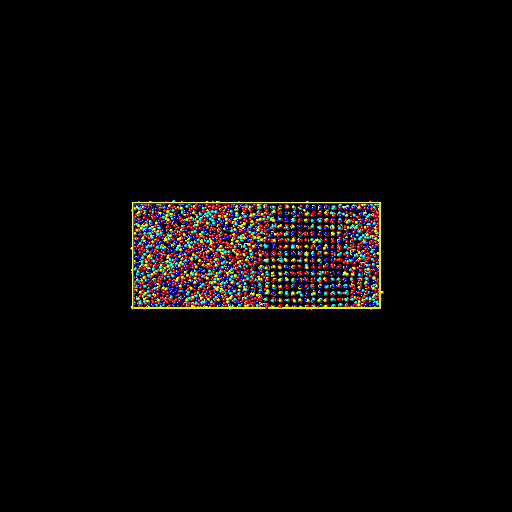

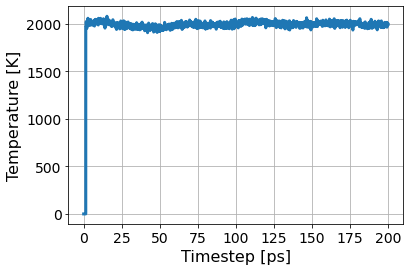

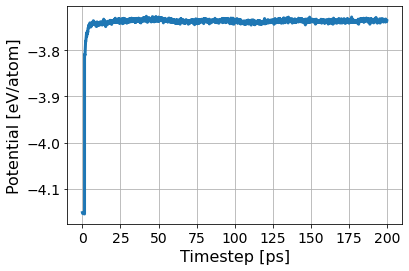

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3d0221c5996f4118b6590e035c113513/inputs.yaml
       RUNS/3d0221c5996f4118b6590e035c113513
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3d0221c5996f4118b6590e035c113513/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:21:22<00:00, 195.32s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3d0221c5996f4118b6590e035c113513/inputs.yaml
       RUNS/3d0221c5996f4118b6590e035c113513
Predicted melting temperature for this potential:  2003.8165479400748
95% confidence interval:  1.7220385231764324
Fraction of system solid:  0.5340711805555556
Fraction of system liquid:  0.4548611111111111
Simulation Success Flag 1.0
Crystal Structure Info:  [2.461e+03 3.100e+01 1.600e+01 4.000e+00 0.000e+00 2.096e+03 4.608e+03]


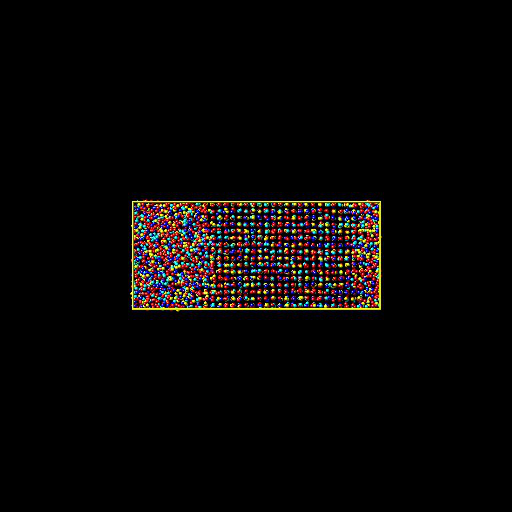

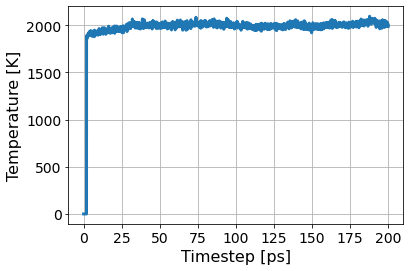

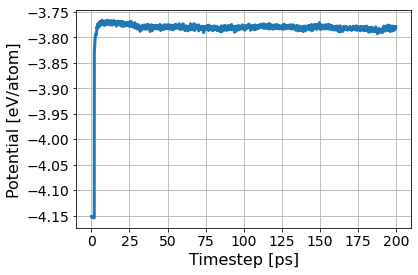

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  4
284
[0.5, 0.1, 0.0, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/23b396d411ab49d5a94635abf2572a56/inputs.yaml
       RUNS/23b396d411ab49d5a94635abf2572a56
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/23b396d411ab49d5a94635abf2572a56/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:08<00:00, 182.75s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/23b396d411ab49d5a94635abf2572a56/inputs.yaml
       RUNS/23b396d411ab49d5a94635abf2572a56
Predicted melting temperature for this potential:  2009.7492123595505
95% confidence interval:  1.3532646754922788
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.100e+01 4.000e+00 3.400e+01 0.000e+00 4.544e+03 4.608e+03]


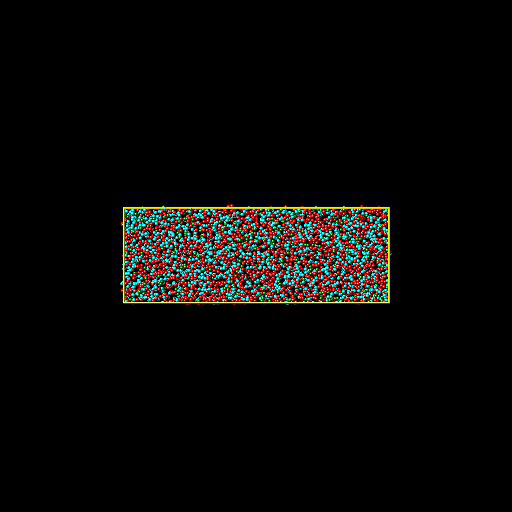

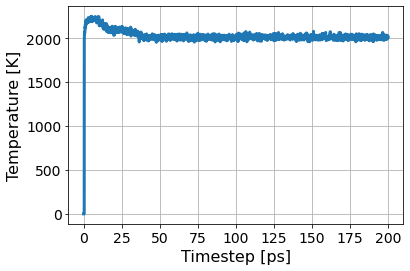

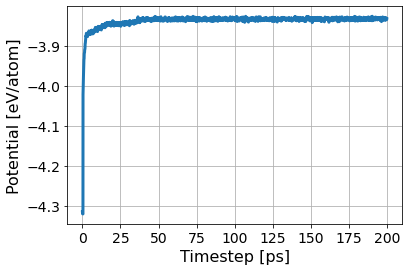

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/45e98b3ce33a435190cc7422b61ec944/inputs.yaml
       RUNS/45e98b3ce33a435190cc7422b61ec944
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/45e98b3ce33a435190cc7422b61ec944/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:18<00:00, 185.55s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/45e98b3ce33a435190cc7422b61ec944/inputs.yaml
       RUNS/45e98b3ce33a435190cc7422b61ec944
Predicted melting temperature for this potential:  2027.7763288389513
95% confidence interval:  1.5350577738351505
Fraction of system solid:  0.2306857638888889
Fraction of system liquid:  0.75390625
Simulation Success Flag 0.0
Crystal Structure Info:  [1063.   36.   15.   20.    0. 3474. 4608.]


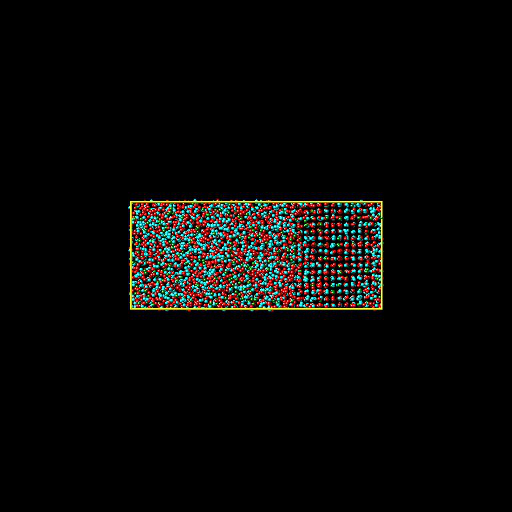

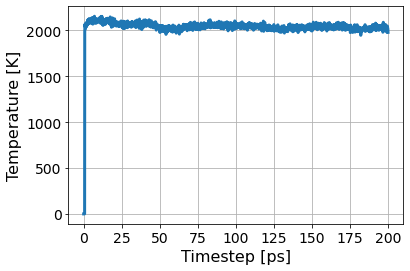

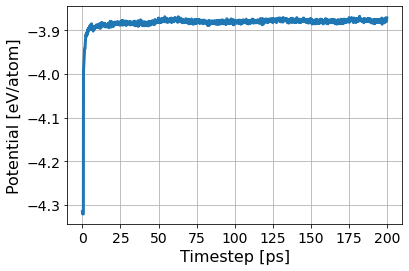

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8fb4223e4d6243508cf368ead5ad43ff/inputs.yaml
       RUNS/8fb4223e4d6243508cf368ead5ad43ff
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8fb4223e4d6243508cf368ead5ad43ff/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:38<00:00, 186.35s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8fb4223e4d6243508cf368ead5ad43ff/inputs.yaml
       RUNS/8fb4223e4d6243508cf368ead5ad43ff
Predicted melting temperature for this potential:  2048.8939619225966
95% confidence interval:  1.496251916060396
Fraction of system solid:  0.4555121527777778
Fraction of system liquid:  0.5266927083333334
Simulation Success Flag 1.0
Crystal Structure Info:  [2.099e+03 5.100e+01 1.800e+01 1.200e+01 1.000e+00 2.427e+03 4.608e+03]


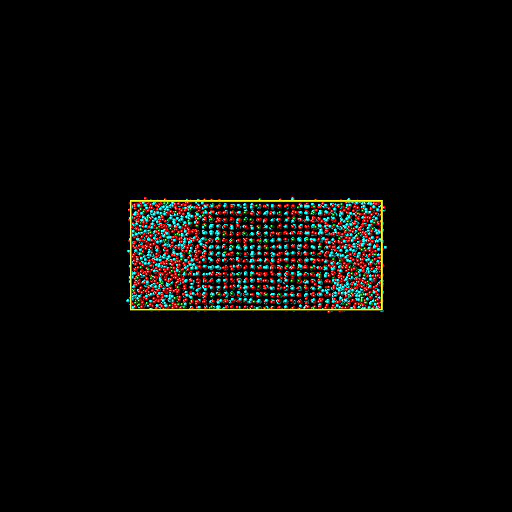

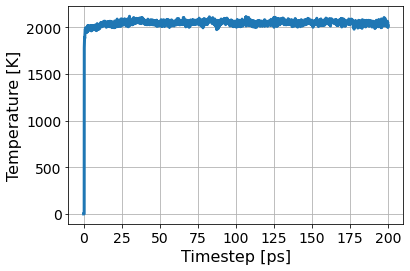

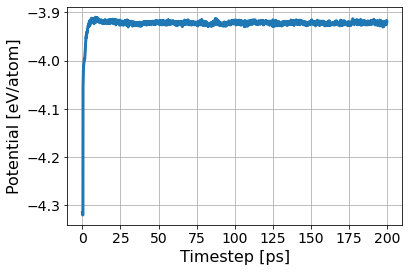

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  5
292
[0.5, 0.1, 0.2, 0.0, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7b2aec28f79d43f4adc1f217d500b1d4/inputs.yaml
       RUNS/7b2aec28f79d43f4adc1f217d500b1d4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7b2aec28f79d43f4adc1f217d500b1d4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:15<00:00, 187.83s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7b2aec28f79d43f4adc1f217d500b1d4/inputs.yaml
       RUNS/7b2aec28f79d43f4adc1f217d500b1d4
Predicted melting temperature for this potential:  2008.9595434456928
95% confidence interval:  1.3316339624190747
Fraction of system solid:  0.0
Fraction of system liquid:  0.9924045138888888
Simulation Success Flag 0.0
Crystal Structure Info:  [0.000e+00 7.000e+00 0.000e+00 2.600e+01 2.000e+00 4.573e+03 4.608e+03]


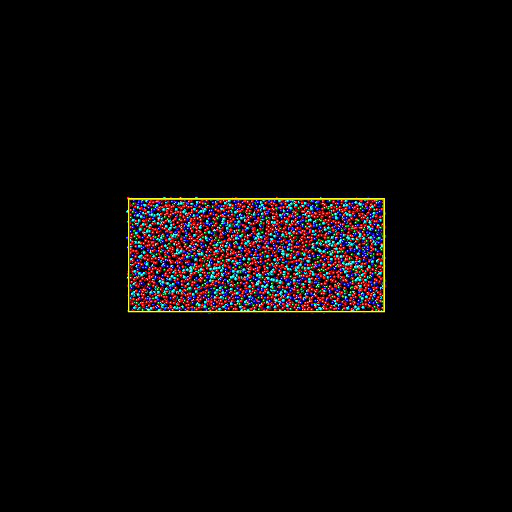

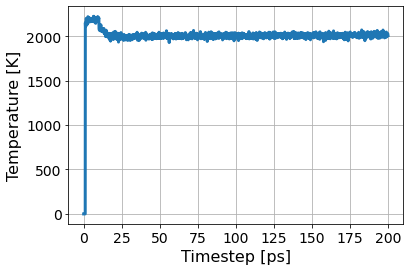

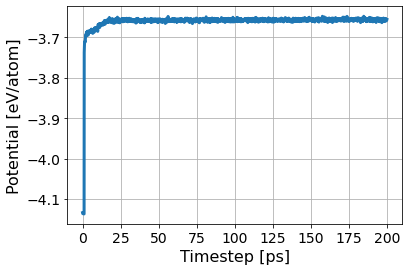

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d029c2fad4564920a7da5748640ac535/inputs.yaml
       RUNS/d029c2fad4564920a7da5748640ac535
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d029c2fad4564920a7da5748640ac535/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:23:24<00:00, 200.16s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d029c2fad4564920a7da5748640ac535/inputs.yaml
       RUNS/d029c2fad4564920a7da5748640ac535
Predicted melting temperature for this potential:  1896.8889204744069
95% confidence interval:  1.253001008019747
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.986328125
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.000e+01 3.000e+00 3.600e+01 1.000e+00 4.545e+03 4.608e+03]


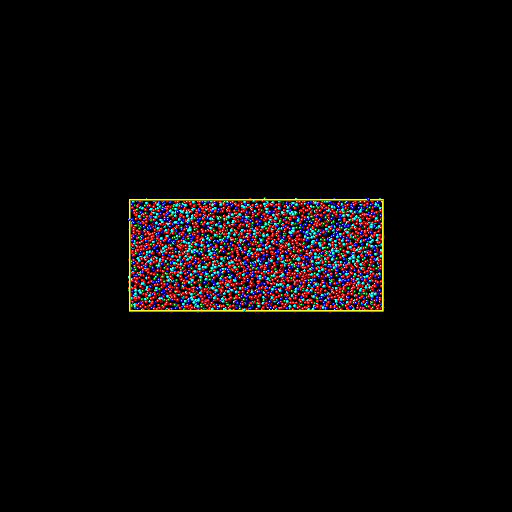

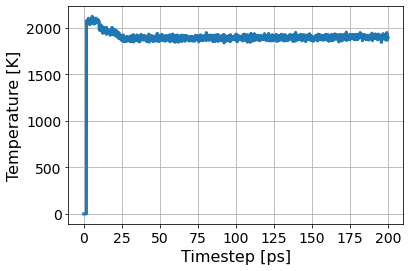

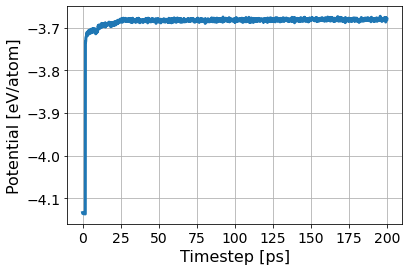

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/49590af37fc24ad88cbba3a29ce53bf5/inputs.yaml
       RUNS/49590af37fc24ad88cbba3a29ce53bf5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/49590af37fc24ad88cbba3a29ce53bf5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:23:04<00:00, 199.40s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/49590af37fc24ad88cbba3a29ce53bf5/inputs.yaml
       RUNS/49590af37fc24ad88cbba3a29ce53bf5
Predicted melting temperature for this potential:  1778.1980731585516
95% confidence interval:  1.1764651019679033
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9895833333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 1.600e+01 0.000e+00 2.900e+01 0.000e+00 4.560e+03 4.608e+03]


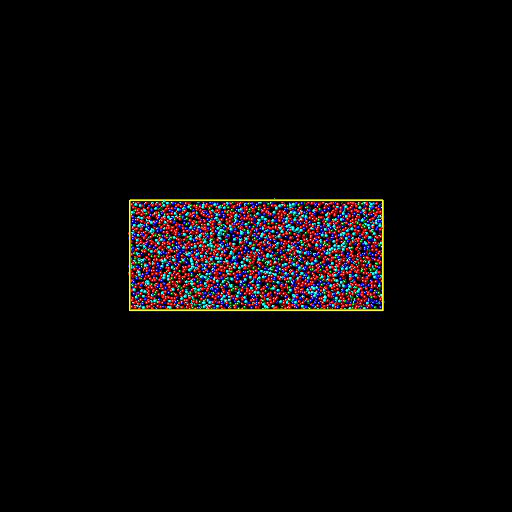

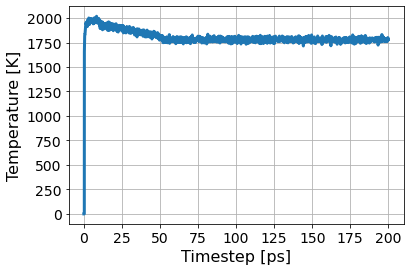

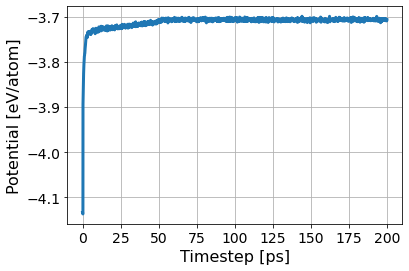

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/46c15118a18e4b24ab6098d19bf4c4c5/inputs.yaml
       RUNS/46c15118a18e4b24ab6098d19bf4c4c5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/46c15118a18e4b24ab6098d19bf4c4c5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:23:38<00:00, 200.73s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/46c15118a18e4b24ab6098d19bf4c4c5/inputs.yaml
       RUNS/46c15118a18e4b24ab6098d19bf4c4c5
Predicted melting temperature for this potential:  1851.936081772784
95% confidence interval:  1.6304410064405925
Fraction of system solid:  0.3663194444444444
Fraction of system liquid:  0.6206597222222222
Simulation Success Flag 1.0
Crystal Structure Info:  [1688.   42.   12.    6.    0. 2860. 4608.]


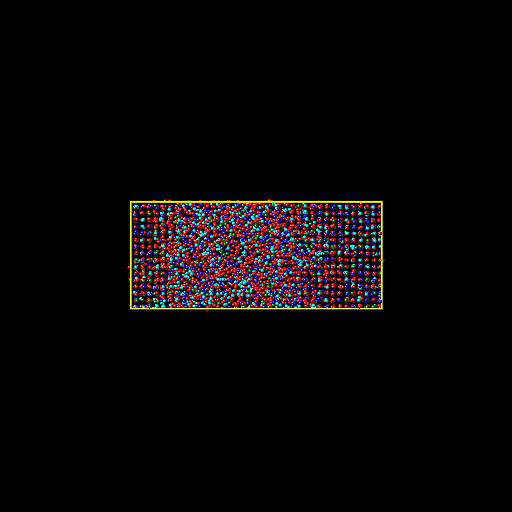

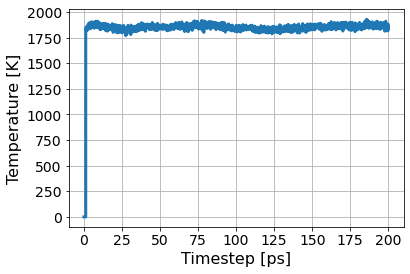

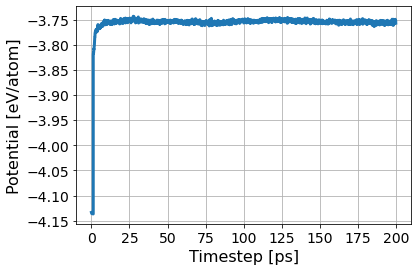

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  6
385
[0.4, 0.2, 0.2, 0.2, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/08d414ddb99b4cfc821323634b679cba/inputs.yaml
       RUNS/08d414ddb99b4cfc821323634b679cba
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/08d414ddb99b4cfc821323634b679cba/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:48<00:00, 191.55s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/08d414ddb99b4cfc821323634b679cba/inputs.yaml
       RUNS/08d414ddb99b4cfc821323634b679cba
Predicted melting temperature for this potential:  2063.3938448189765
95% confidence interval:  1.4234927579770051
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9915364583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.500e+01 0.000e+00 1.700e+01 1.000e+00 4.569e+03 4.608e+03]


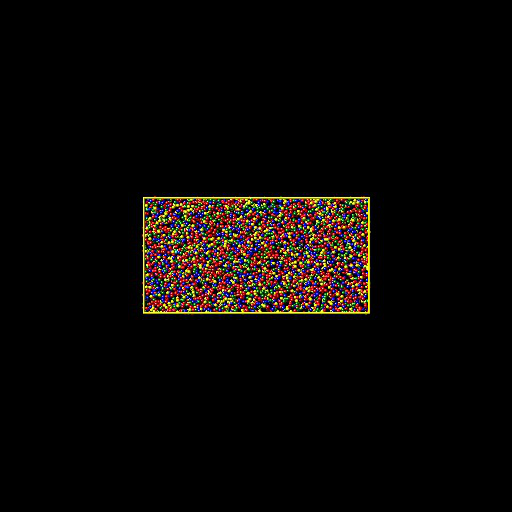

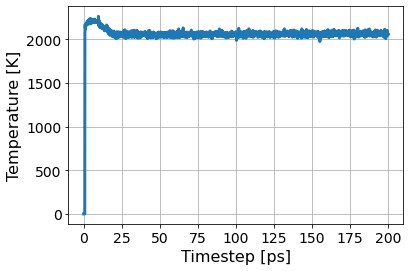

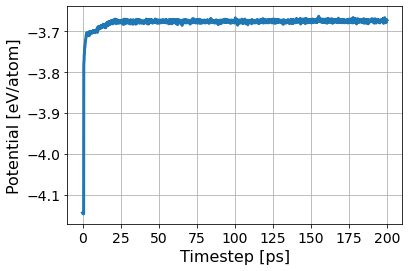

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/44e622d585604be5bf6f86e35585a87f/inputs.yaml
       RUNS/44e622d585604be5bf6f86e35585a87f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/44e622d585604be5bf6f86e35585a87f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:56<00:00, 187.07s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/44e622d585604be5bf6f86e35585a87f/inputs.yaml
       RUNS/44e622d585604be5bf6f86e35585a87f
Predicted melting temperature for this potential:  1933.6403596754055
95% confidence interval:  1.3143132776326831
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9839409722222222
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.900e+01 2.000e+00 3.900e+01 0.000e+00 4.534e+03 4.608e+03]


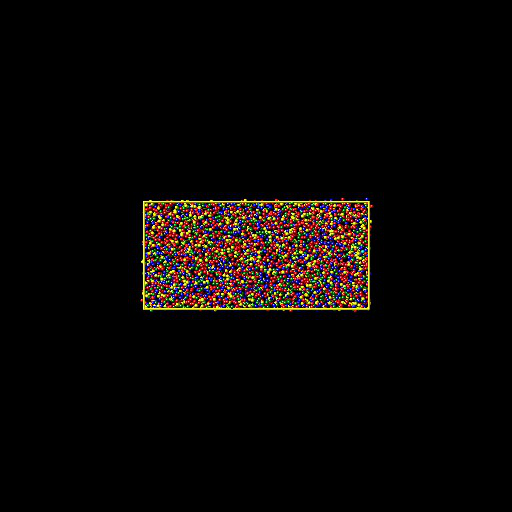

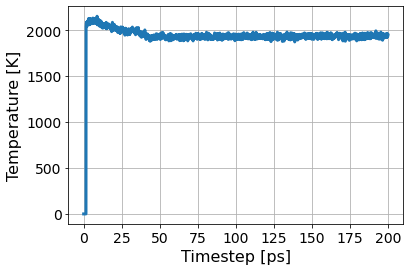

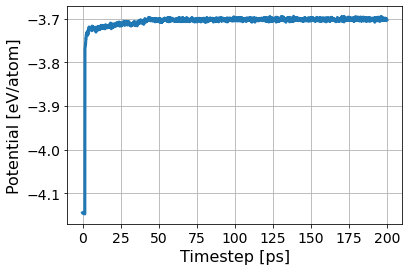

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54215ac7a8c84048907bf998b4164393/inputs.yaml
       RUNS/54215ac7a8c84048907bf998b4164393
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/54215ac7a8c84048907bf998b4164393/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:06<00:00, 192.28s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54215ac7a8c84048907bf998b4164393/inputs.yaml
       RUNS/54215ac7a8c84048907bf998b4164393
Predicted melting temperature for this potential:  1979.898779525593
95% confidence interval:  1.4414518552120128
Fraction of system solid:  0.3274739583333333
Fraction of system liquid:  0.6590711805555556
Simulation Success Flag 0.0
Crystal Structure Info:  [1509.   34.   14.   14.    0. 3037. 4608.]


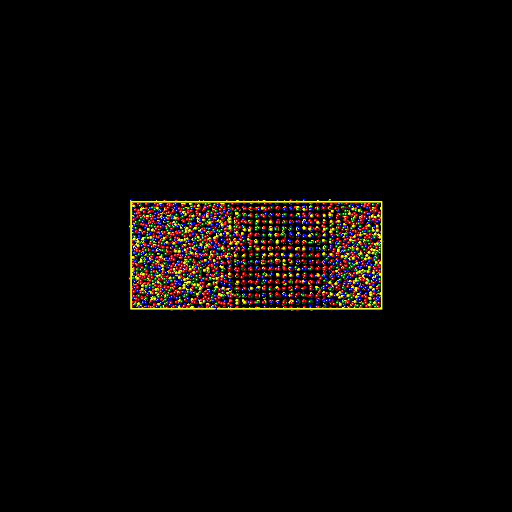

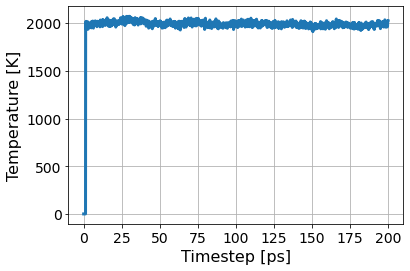

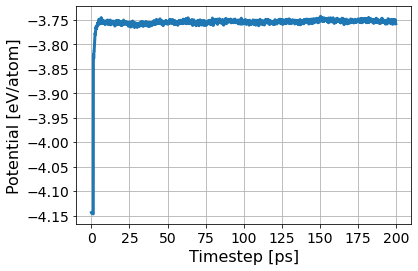

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/95d25bdee7034a9d97a024f23a7674ad/inputs.yaml
       RUNS/95d25bdee7034a9d97a024f23a7674ad
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/95d25bdee7034a9d97a024f23a7674ad/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:21:25<00:00, 195.44s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/95d25bdee7034a9d97a024f23a7674ad/inputs.yaml
       RUNS/95d25bdee7034a9d97a024f23a7674ad
Predicted melting temperature for this potential:  1987.5804923845196
95% confidence interval:  1.4673774971704436
Fraction of system solid:  0.5217013888888888
Fraction of system liquid:  0.4559461805555556
Simulation Success Flag 1.0
Crystal Structure Info:  [2.404e+03 6.300e+01 2.800e+01 1.100e+01 1.000e+00 2.101e+03 4.608e+03]


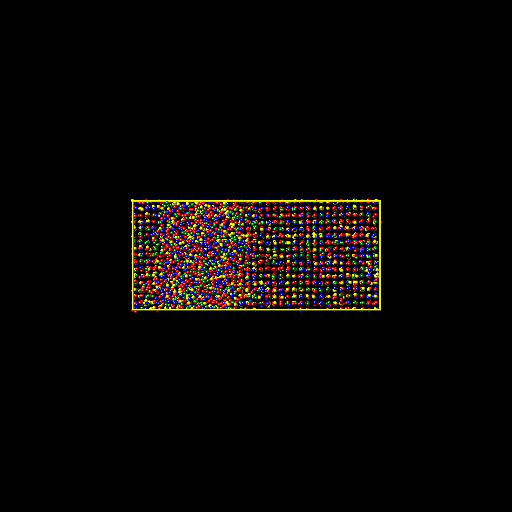

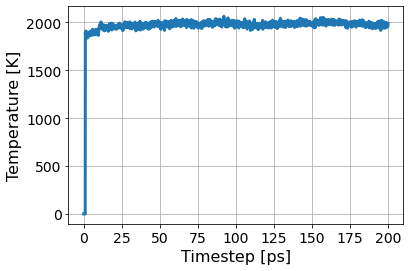

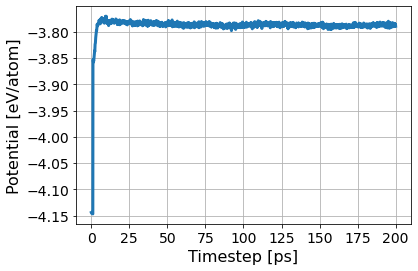

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  7
540
[0.5, 0.4, 0.0, 0.0, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f0b940c4e8434a17909e830965f95532/inputs.yaml
       RUNS/f0b940c4e8434a17909e830965f95532
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f0b940c4e8434a17909e830965f95532/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:42<00:00, 184.10s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f0b940c4e8434a17909e830965f95532/inputs.yaml
       RUNS/f0b940c4e8434a17909e830965f95532
Predicted melting temperature for this potential:  2046.5974094881396
95% confidence interval:  1.35915136808164
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9869791666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.800e+01 2.000e+00 3.400e+01 1.000e+00 4.548e+03 4.608e+03]


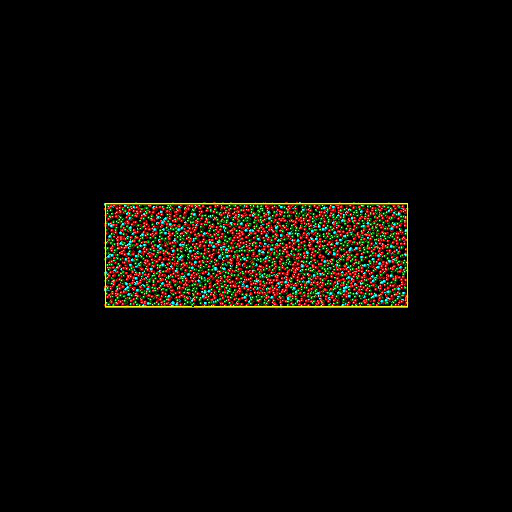

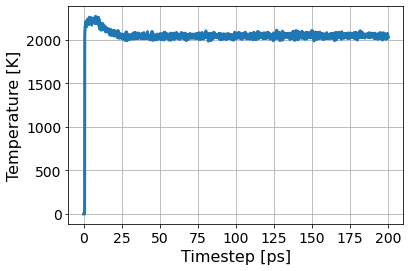

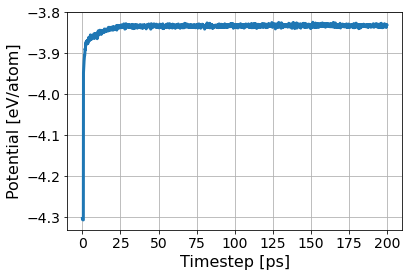

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b84a8c358b6a43a4897fad05c95bb9e3/inputs.yaml
       RUNS/b84a8c358b6a43a4897fad05c95bb9e3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b84a8c358b6a43a4897fad05c95bb9e3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:52<00:00, 182.10s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b84a8c358b6a43a4897fad05c95bb9e3/inputs.yaml
       RUNS/b84a8c358b6a43a4897fad05c95bb9e3
Predicted melting temperature for this potential:  1919.6458397003748
95% confidence interval:  1.2382255056607343
Fraction of system solid:  0.002170138888888889
Fraction of system liquid:  0.9819878472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+01 3.400e+01 4.000e+00 3.500e+01 0.000e+00 4.525e+03 4.608e+03]


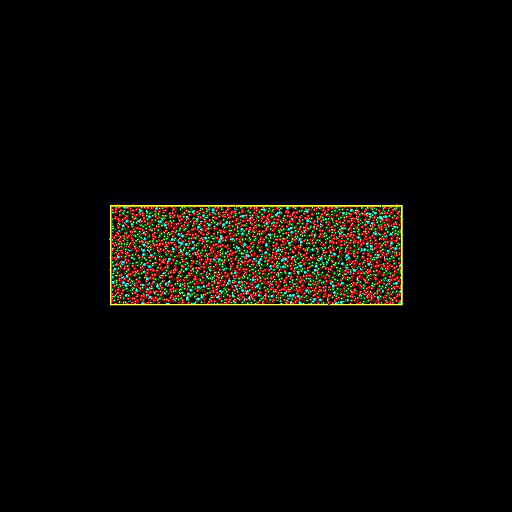

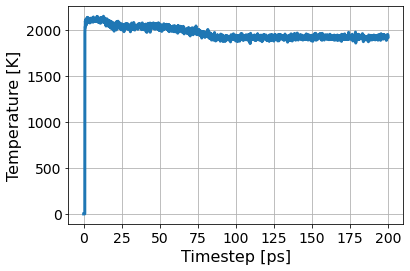

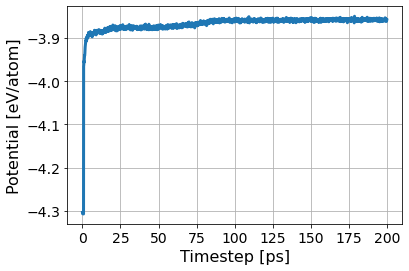

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/098155906b16490caf9389f6072dbdb4/inputs.yaml
       RUNS/098155906b16490caf9389f6072dbdb4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/098155906b16490caf9389f6072dbdb4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:53<00:00, 182.15s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/098155906b16490caf9389f6072dbdb4/inputs.yaml
       RUNS/098155906b16490caf9389f6072dbdb4
Predicted melting temperature for this potential:  2027.7233850187265
95% confidence interval:  1.446661115901285
Fraction of system solid:  0.4453125
Fraction of system liquid:  0.5334201388888888
Simulation Success Flag 1.0
Crystal Structure Info:  [2052.   48.   36.   14.    0. 2458. 4608.]


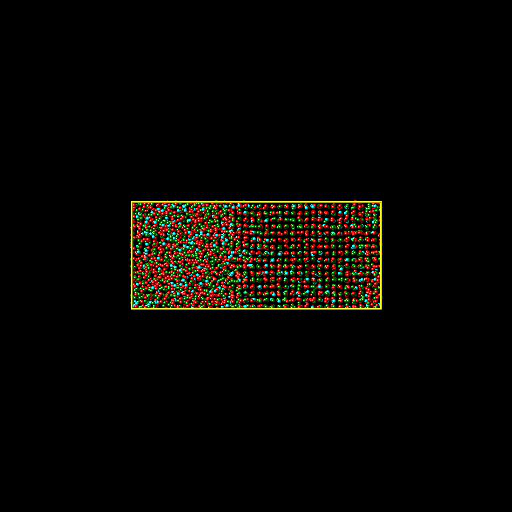

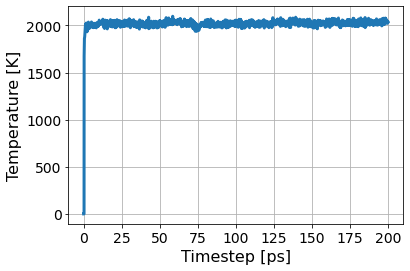

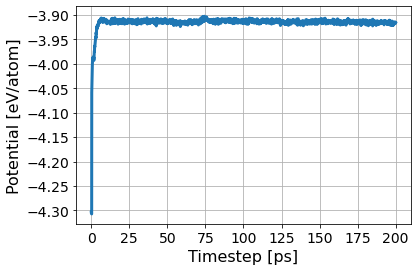

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  8
310
[0.0, 0.2, 0.3, 0.0, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bcab9713e4914f60bc3980931afced31/inputs.yaml
       RUNS/bcab9713e4914f60bc3980931afced31
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/bcab9713e4914f60bc3980931afced31/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:00<00:00, 184.80s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bcab9713e4914f60bc3980931afced31/inputs.yaml
       RUNS/bcab9713e4914f60bc3980931afced31
Predicted melting temperature for this potential:  1906.0909642946317
95% confidence interval:  1.1976081140239054
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 3.100e+01 2.000e+00 1.600e+01 3.000e+00 4.551e+03 4.608e+03]


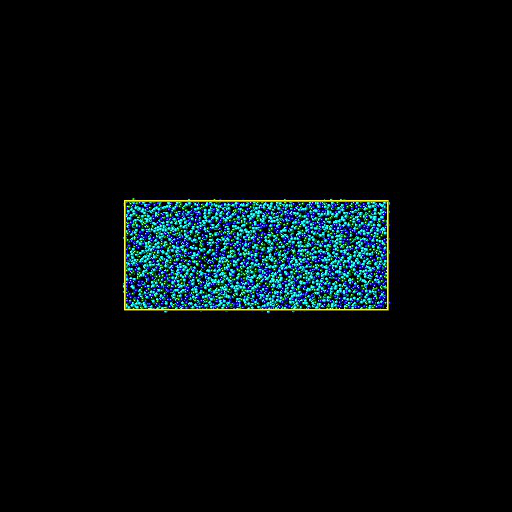

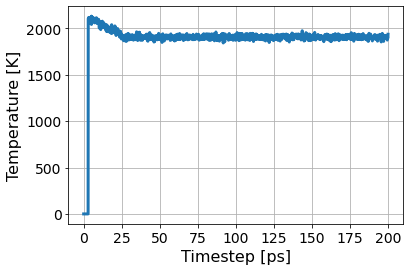

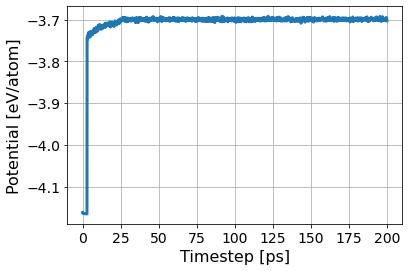

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a561200bf704431ea5e4843e428e8d19/inputs.yaml
       RUNS/a561200bf704431ea5e4843e428e8d19
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a561200bf704431ea5e4843e428e8d19/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:47<00:00, 184.30s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a561200bf704431ea5e4843e428e8d19/inputs.yaml
       RUNS/a561200bf704431ea5e4843e428e8d19
Predicted melting temperature for this potential:  1882.628450811486
95% confidence interval:  1.374988430246862
Fraction of system solid:  0.15928819444444445
Fraction of system liquid:  0.8255208333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [7.340e+02 3.800e+01 1.000e+01 1.900e+01 3.000e+00 3.804e+03 4.608e+03]


Executing: 100%|??????????| 25/25 [1:17:25<00:00, 185.82s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d9d10e8b02ad4461b468f55ff0d29d2a/inputs.yaml
       RUNS/d9d10e8b02ad4461b468f55ff0d29d2a
Predicted melting temperature for this potential:  1881.0771898876403
95% confidence interval:  1.5176919477140676
Fraction of system solid:  0.3962673611111111
Fraction of system liquid:  0.5870225694444444
Simulation Success Flag 1.0
Crystal Structure Info:  [1826.   53.   14.   10.    0. 2705. 4608.]


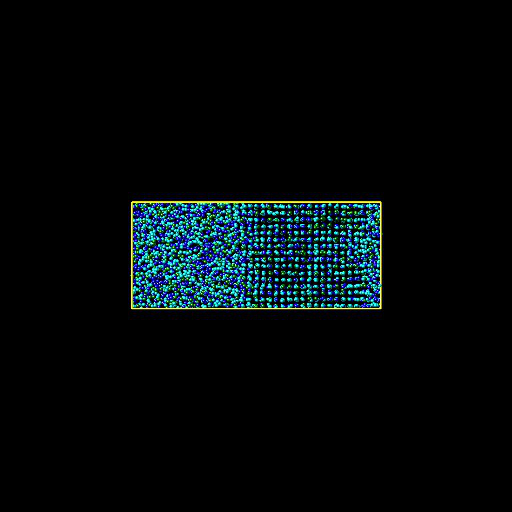

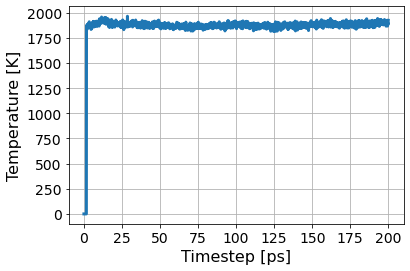

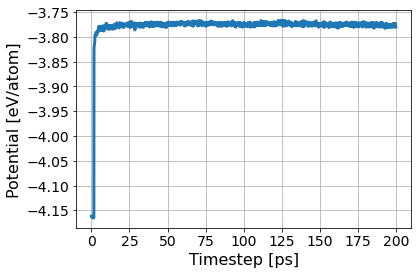

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  9
258
[0.3, 0.1, 0.3, 0.3, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1904e231e4bc4bf3bf7b18f3f3cce0d0/inputs.yaml
       RUNS/1904e231e4bc4bf3bf7b18f3f3cce0d0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1904e231e4bc4bf3bf7b18f3f3cce0d0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:32<00:00, 188.50s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1904e231e4bc4bf3bf7b18f3f3cce0d0/inputs.yaml
       RUNS/1904e231e4bc4bf3bf7b18f3f3cce0d0
Predicted melting temperature for this potential:  2142.605979400749
95% confidence interval:  1.4450564829409382
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.9945746527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 9.000e+00 1.000e+00 1.400e+01 0.000e+00 4.583e+03 4.608e+03]


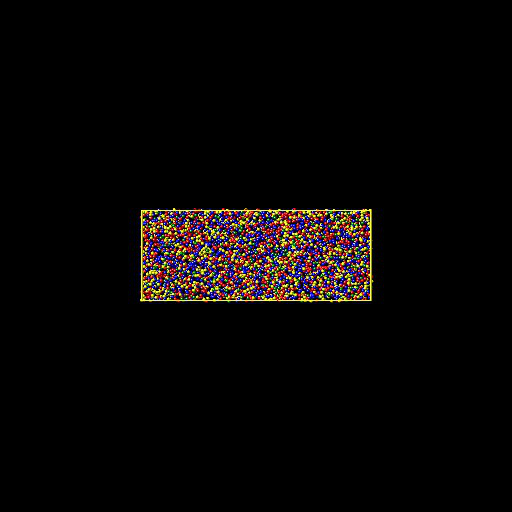

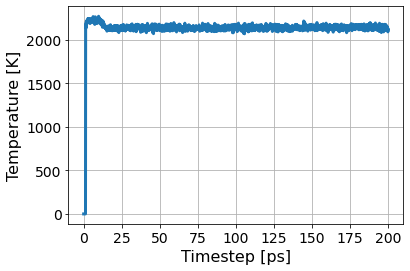

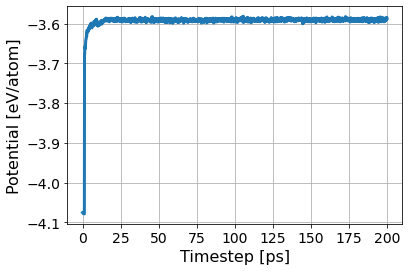

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/982ceed4ca2e4c6184f98a4788f16427/inputs.yaml
       RUNS/982ceed4ca2e4c6184f98a4788f16427
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/982ceed4ca2e4c6184f98a4788f16427/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:09<00:00, 189.99s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/982ceed4ca2e4c6184f98a4788f16427/inputs.yaml
       RUNS/982ceed4ca2e4c6184f98a4788f16427
Predicted melting temperature for this potential:  1977.9275009987514
95% confidence interval:  1.2913870427071956
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9911024305555556
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.800e+01 0.000e+00 1.700e+01 2.000e+00 4.567e+03 4.608e+03]


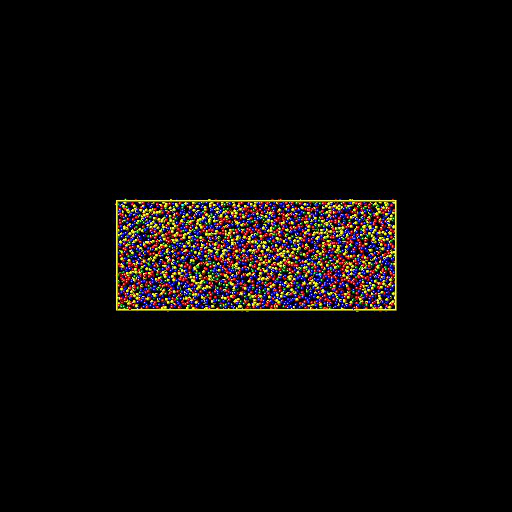

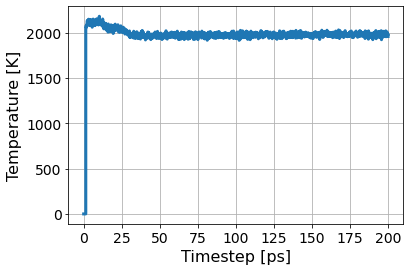

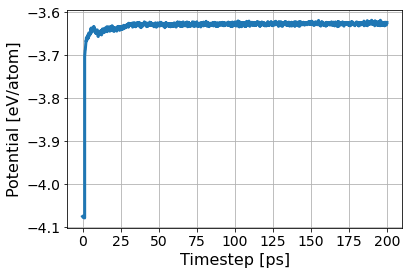

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e6960a9e2321411eaff1431e308f3d31/inputs.yaml
       RUNS/e6960a9e2321411eaff1431e308f3d31
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e6960a9e2321411eaff1431e308f3d31/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:51<00:00, 189.28s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e6960a9e2321411eaff1431e308f3d31/inputs.yaml
       RUNS/e6960a9e2321411eaff1431e308f3d31
Predicted melting temperature for this potential:  1984.6207299625469
95% confidence interval:  1.4710132220034096
Fraction of system solid:  0.24305555555555555
Fraction of system liquid:  0.7352430555555556
Simulation Success Flag 0.0
Crystal Structure Info:  [1120.   63.   20.   17.    0. 3388. 4608.]


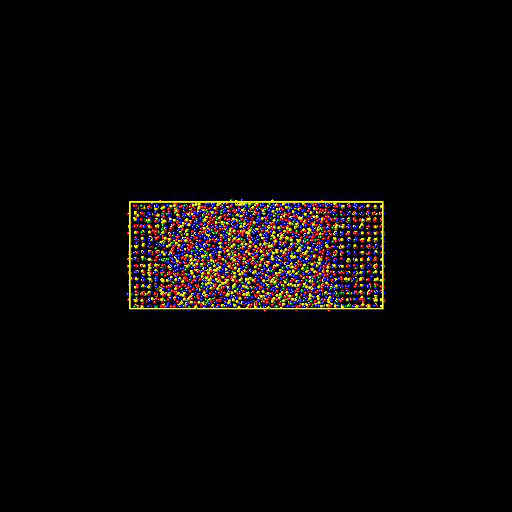

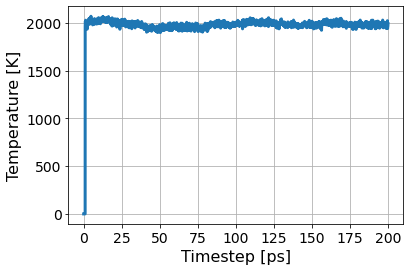

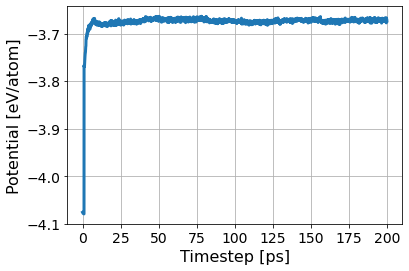

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7cd1e821fea947baa035740badf1912a/inputs.yaml
       RUNS/7cd1e821fea947baa035740badf1912a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7cd1e821fea947baa035740badf1912a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:42<00:00, 191.31s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7cd1e821fea947baa035740badf1912a/inputs.yaml
       RUNS/7cd1e821fea947baa035740badf1912a
Predicted melting temperature for this potential:  1974.2815860174783
95% confidence interval:  1.356194708622963
Fraction of system solid:  0.4828559027777778
Fraction of system liquid:  0.5041232638888888
Simulation Success Flag 1.0
Crystal Structure Info:  [2.225e+03 3.700e+01 1.100e+01 1.000e+01 2.000e+00 2.323e+03 4.608e+03]


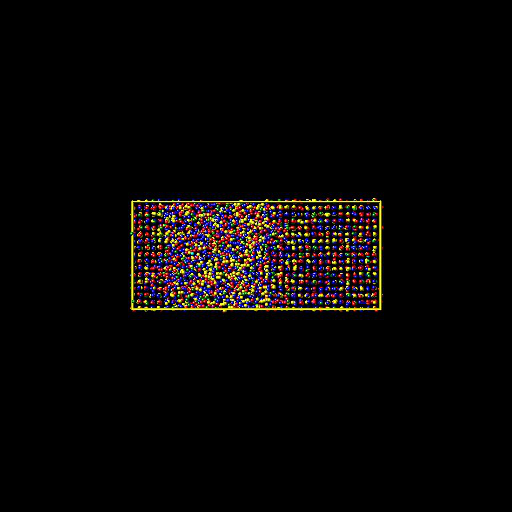

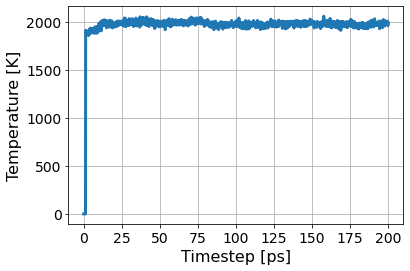

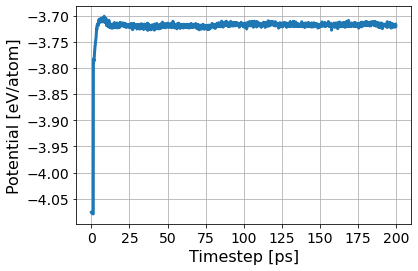

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  10
146
[0.4, 0.0, 0.2, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a5ff50f970f240628ccdf0b32e71338d/inputs.yaml
       RUNS/a5ff50f970f240628ccdf0b32e71338d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a5ff50f970f240628ccdf0b32e71338d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:00<00:00, 184.83s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a5ff50f970f240628ccdf0b32e71338d/inputs.yaml
       RUNS/a5ff50f970f240628ccdf0b32e71338d
Predicted melting temperature for this potential:  2023.051365418227
95% confidence interval:  1.3848361167139485
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9904513888888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.000e+01 2.000e+00 2.400e+01 2.000e+00 4.564e+03 4.608e+03]


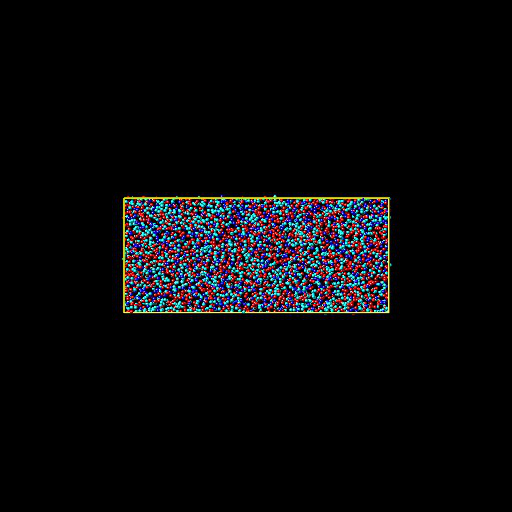

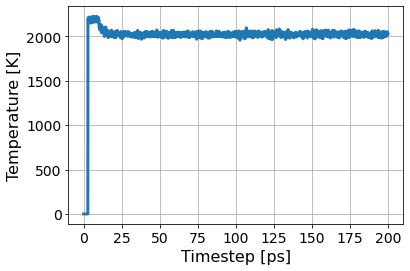

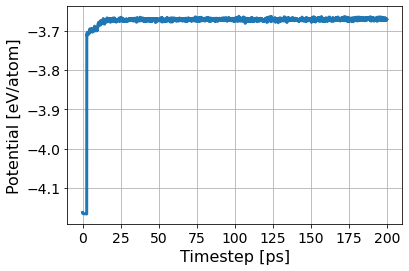

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7d204862ae4a4e7fb2008d1a0f99a0e5/inputs.yaml
       RUNS/7d204862ae4a4e7fb2008d1a0f99a0e5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7d204862ae4a4e7fb2008d1a0f99a0e5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:05<00:00, 185.02s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7d204862ae4a4e7fb2008d1a0f99a0e5/inputs.yaml
       RUNS/7d204862ae4a4e7fb2008d1a0f99a0e5
Predicted melting temperature for this potential:  1880.5193367041197
95% confidence interval:  1.2378453951637418
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9891493055555556
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.100e+01 2.000e+00 3.300e+01 0.000e+00 4.558e+03 4.608e+03]


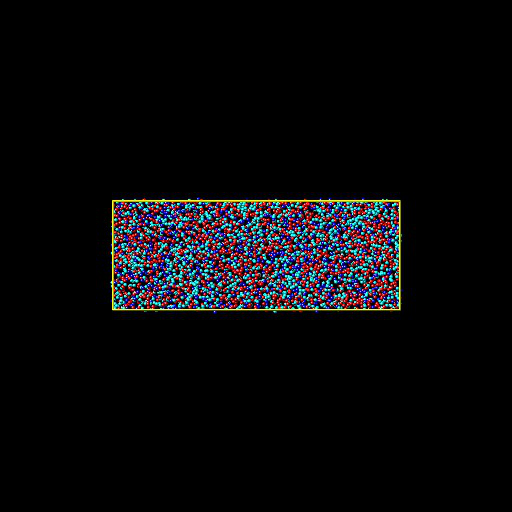

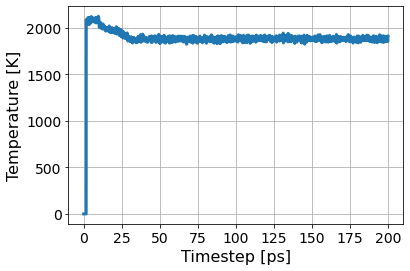

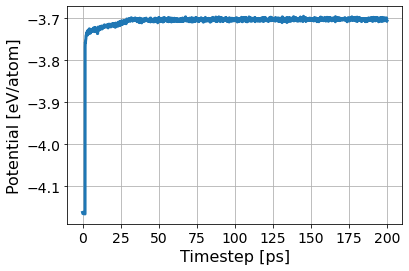

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4d00660fc9e04af2bbf86655154d1cc0/inputs.yaml
       RUNS/4d00660fc9e04af2bbf86655154d1cc0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4d00660fc9e04af2bbf86655154d1cc0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:57<00:00, 184.71s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4d00660fc9e04af2bbf86655154d1cc0/inputs.yaml
       RUNS/4d00660fc9e04af2bbf86655154d1cc0
Predicted melting temperature for this potential:  1902.46167690387
95% confidence interval:  1.40812673262923
Fraction of system solid:  0.2170138888888889
Fraction of system liquid:  0.7673611111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1000.   38.   10.   24.    0. 3536. 4608.]


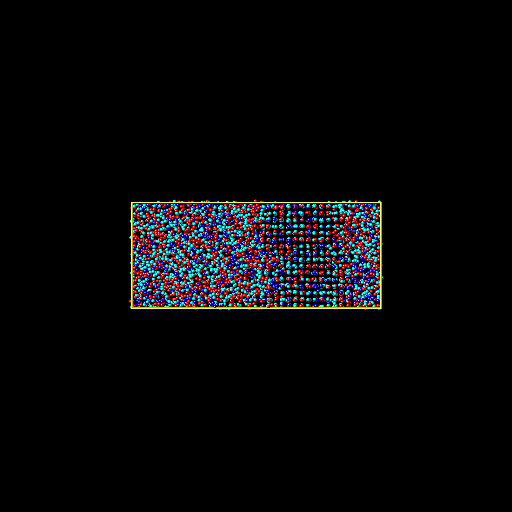

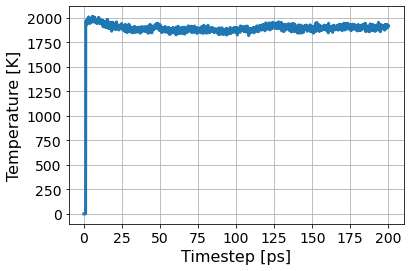

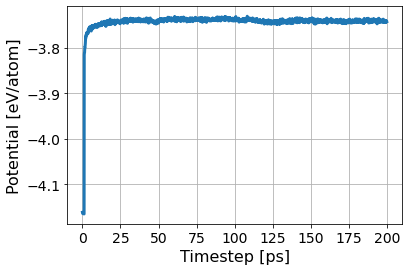

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1f18595ff55b4e939be04a7a6a9cedef/inputs.yaml
       RUNS/1f18595ff55b4e939be04a7a6a9cedef
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1f18595ff55b4e939be04a7a6a9cedef/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:23<00:00, 185.75s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1f18595ff55b4e939be04a7a6a9cedef/inputs.yaml
       RUNS/1f18595ff55b4e939be04a7a6a9cedef
Predicted melting temperature for this potential:  1868.66050474407
95% confidence interval:  1.3957751136066623
Fraction of system solid:  0.3674045138888889
Fraction of system liquid:  0.6150173611111112
Simulation Success Flag 1.0
Crystal Structure Info:  [1693.   56.   12.   13.    0. 2834. 4608.]


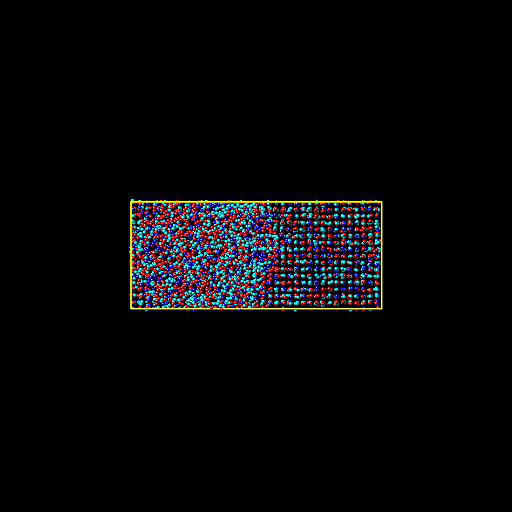

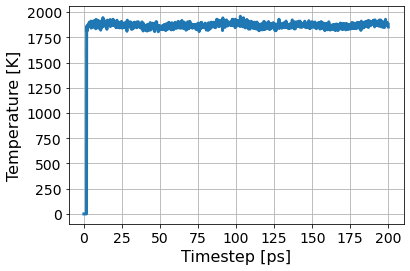

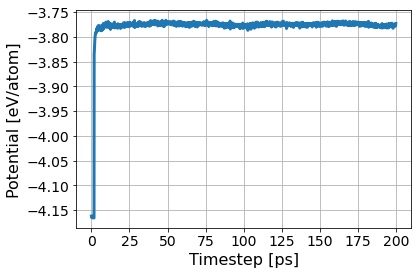

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  11
140
[0.4, 0.0, 0.1, 0.0, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/04c8d8265f854ae68d1e158a56ddf0fe/inputs.yaml
       RUNS/04c8d8265f854ae68d1e158a56ddf0fe
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/04c8d8265f854ae68d1e158a56ddf0fe/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:32<00:00, 181.30s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/04c8d8265f854ae68d1e158a56ddf0fe/inputs.yaml
       RUNS/04c8d8265f854ae68d1e158a56ddf0fe
Predicted melting temperature for this potential:  2008.8873599250937
95% confidence interval:  1.2974659779170783
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.800e+01 1.000e+00 2.700e+01 2.000e+00 4.544e+03 4.608e+03]


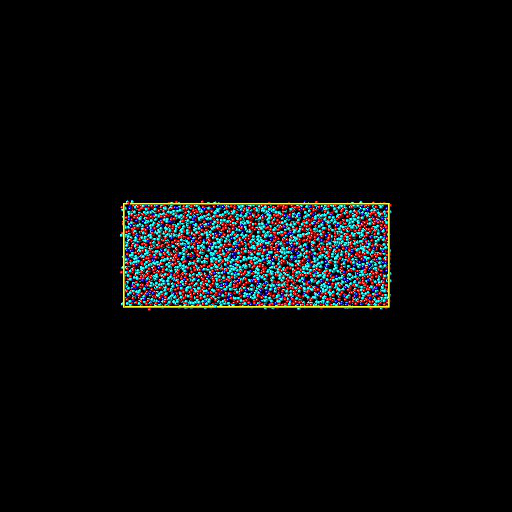

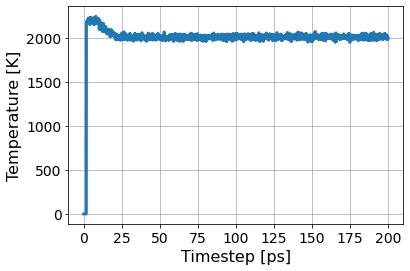

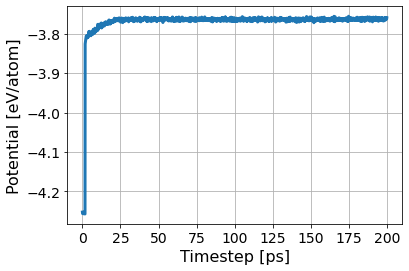

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/39d99d4e077c4fc0949d2726a8428af2/inputs.yaml
       RUNS/39d99d4e077c4fc0949d2726a8428af2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/39d99d4e077c4fc0949d2726a8428af2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:08<00:00, 182.75s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/39d99d4e077c4fc0949d2726a8428af2/inputs.yaml
       RUNS/39d99d4e077c4fc0949d2726a8428af2
Predicted melting temperature for this potential:  1879.3540570536832
95% confidence interval:  1.2059305008371062
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9837239583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 3.400e+01 0.000e+00 3.200e+01 1.000e+00 4.533e+03 4.608e+03]


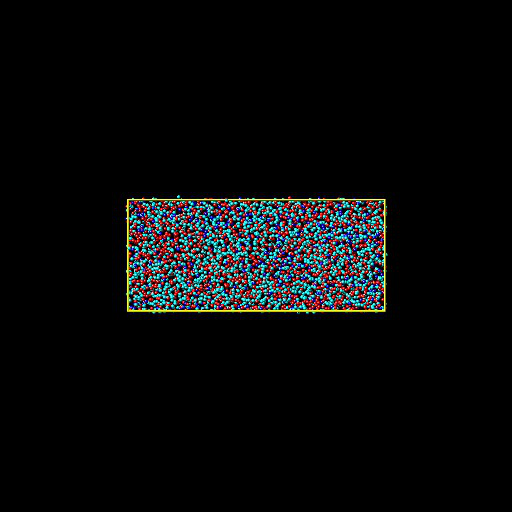

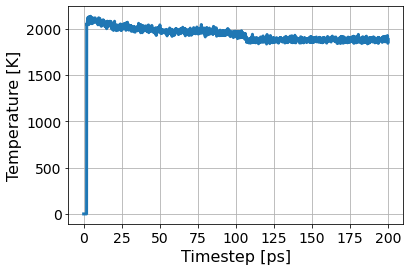

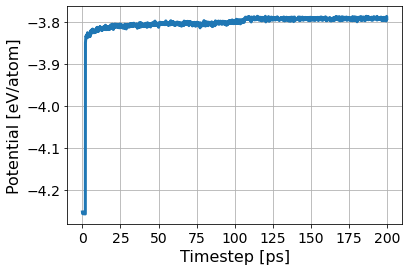

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/758c42538ea74dd18d1f0aaacacb2da8/inputs.yaml
       RUNS/758c42538ea74dd18d1f0aaacacb2da8
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/758c42538ea74dd18d1f0aaacacb2da8/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:21<00:00, 185.67s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/758c42538ea74dd18d1f0aaacacb2da8/inputs.yaml
       RUNS/758c42538ea74dd18d1f0aaacacb2da8
Predicted melting temperature for this potential:  1990.2905885143573
95% confidence interval:  1.504228756001454
Fraction of system solid:  0.431640625
Fraction of system liquid:  0.5579427083333334
Simulation Success Flag 1.0
Crystal Structure Info:  [1.989e+03 2.800e+01 5.000e+00 1.400e+01 1.000e+00 2.571e+03 4.608e+03]


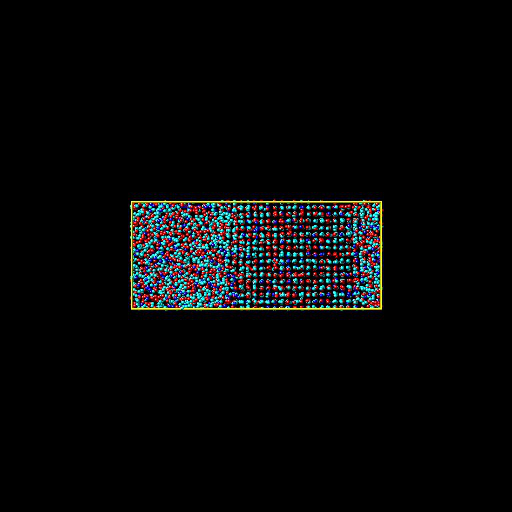

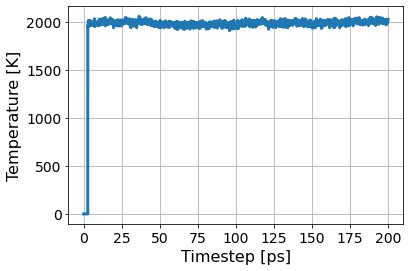

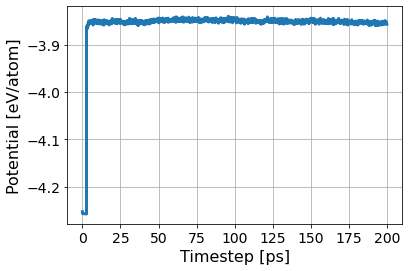

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  12
169
[0.5, 0.0, 0.2, 0.0, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54cdf21ac5904d5e89fb57233f9cd855/inputs.yaml
       RUNS/54cdf21ac5904d5e89fb57233f9cd855
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/54cdf21ac5904d5e89fb57233f9cd855/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:35<00:00, 181.42s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54cdf21ac5904d5e89fb57233f9cd855/inputs.yaml
       RUNS/54cdf21ac5904d5e89fb57233f9cd855
Predicted melting temperature for this potential:  1946.377822721598
95% confidence interval:  1.225687723965688
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9924045138888888
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.200e+01 1.000e+00 1.800e+01 0.000e+00 4.573e+03 4.608e+03]


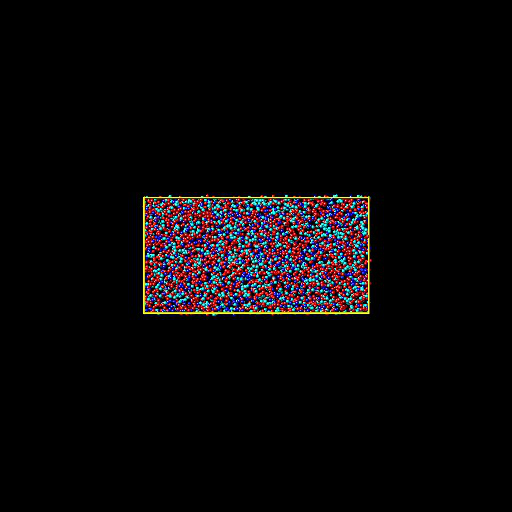

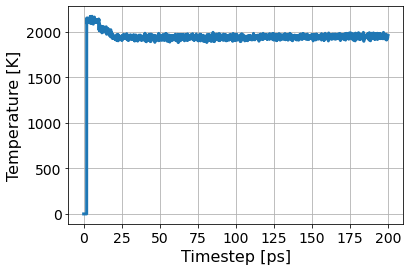

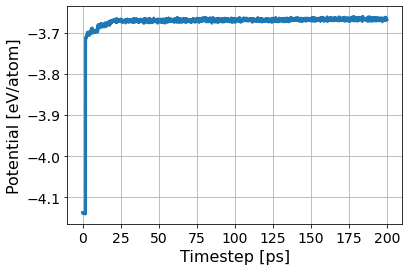

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2a29c4a5b80e476fb85b75be0eca3a67/inputs.yaml
       RUNS/2a29c4a5b80e476fb85b75be0eca3a67
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2a29c4a5b80e476fb85b75be0eca3a67/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:45<00:00, 181.82s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2a29c4a5b80e476fb85b75be0eca3a67/inputs.yaml
       RUNS/2a29c4a5b80e476fb85b75be0eca3a67
Predicted melting temperature for this potential:  1836.9510076154806
95% confidence interval:  1.223084850135111
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9867621527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.300e+01 0.000e+00 3.300e+01 2.000e+00 4.547e+03 4.608e+03]


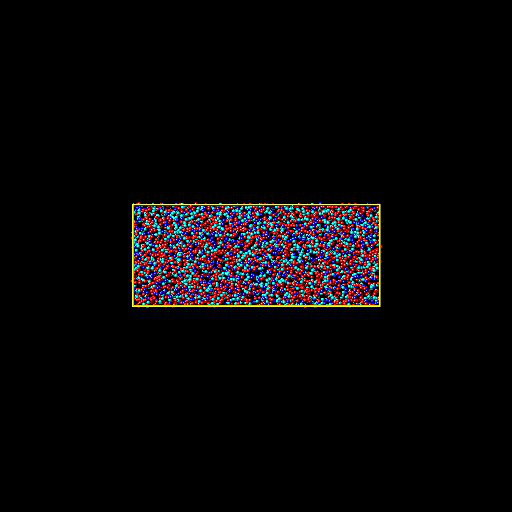

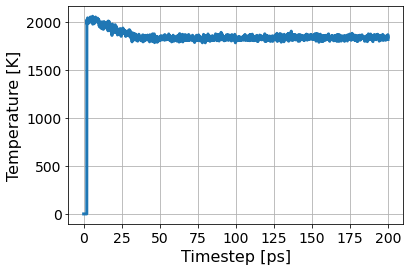

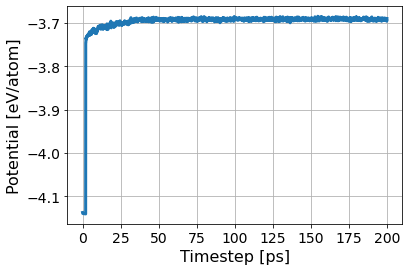

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/10d1795211014a569e76dedc9fe6ab9f/inputs.yaml
       RUNS/10d1795211014a569e76dedc9fe6ab9f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/10d1795211014a569e76dedc9fe6ab9f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:33<00:00, 183.74s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/10d1795211014a569e76dedc9fe6ab9f/inputs.yaml
       RUNS/10d1795211014a569e76dedc9fe6ab9f
Predicted melting temperature for this potential:  1826.2082631710362
95% confidence interval:  1.2987960893223713
Fraction of system solid:  0.1605902777777778
Fraction of system liquid:  0.8224826388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [7.400e+02 5.000e+01 1.100e+01 1.600e+01 1.000e+00 3.790e+03 4.608e+03]


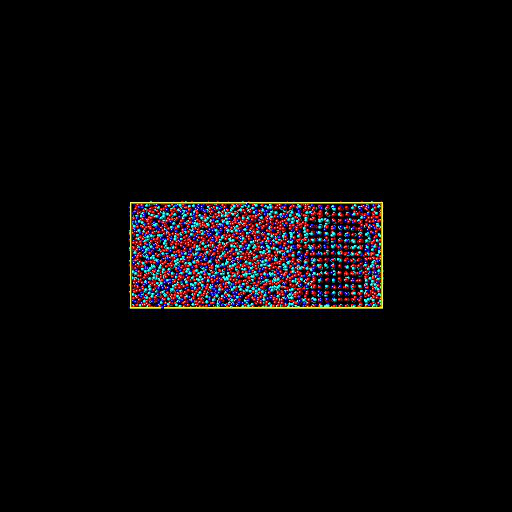

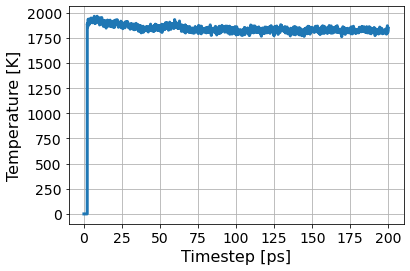

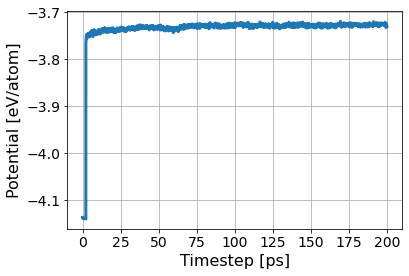

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c1fdd95fcbf44962849e951e4f476e59/inputs.yaml
       RUNS/c1fdd95fcbf44962849e951e4f476e59
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c1fdd95fcbf44962849e951e4f476e59/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:42<00:00, 186.49s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c1fdd95fcbf44962849e951e4f476e59/inputs.yaml
       RUNS/c1fdd95fcbf44962849e951e4f476e59
Predicted melting temperature for this potential:  1833.6797383270912
95% confidence interval:  1.226406071266135
Fraction of system solid:  0.4086371527777778
Fraction of system liquid:  0.58203125
Simulation Success Flag 1.0
Crystal Structure Info:  [1883.   20.   13.   10.    0. 2682. 4608.]


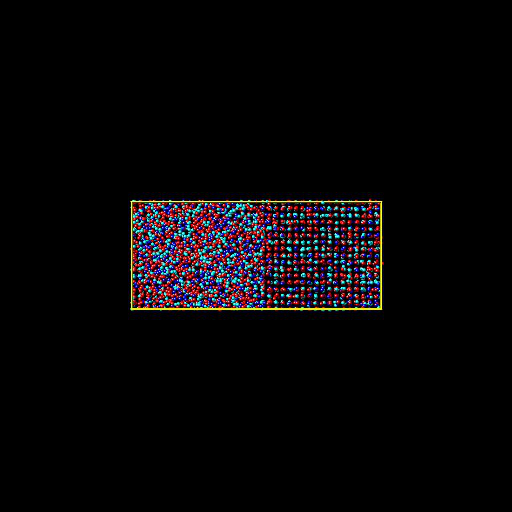

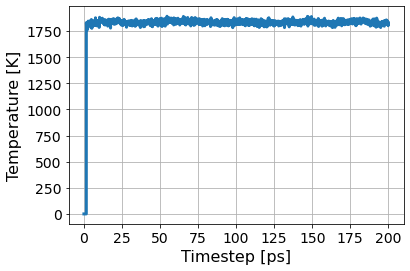

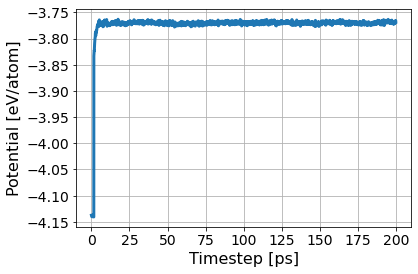

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  13
164
[0.5, 0.0, 0.1, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2342432a02c941d6a69135748616a5d7/inputs.yaml
       RUNS/2342432a02c941d6a69135748616a5d7
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2342432a02c941d6a69135748616a5d7/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:28<00:00, 183.55s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2342432a02c941d6a69135748616a5d7/inputs.yaml
       RUNS/2342432a02c941d6a69135748616a5d7
Predicted melting temperature for this potential:  1990.4039681647942
95% confidence interval:  1.3407835048159547
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9898003472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 1.900e+01 2.000e+00 2.200e+01 1.000e+00 4.561e+03 4.608e+03]


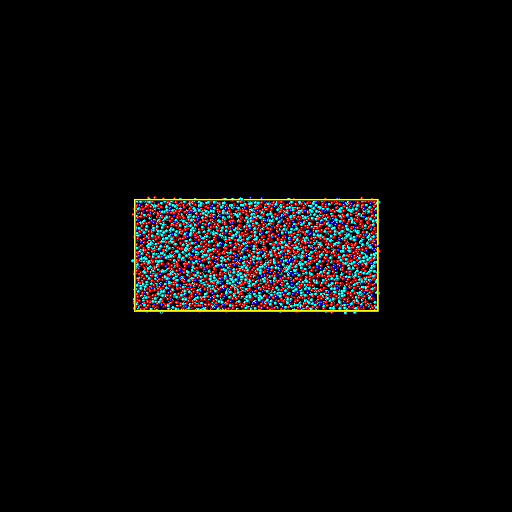

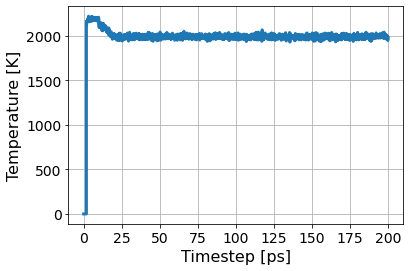

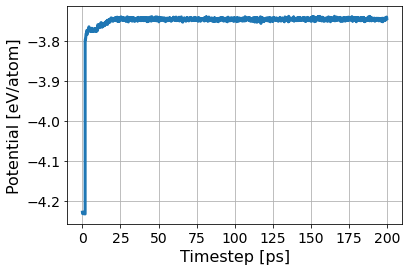

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4af1eb83c21f425fb27b2e7d08707c58/inputs.yaml
       RUNS/4af1eb83c21f425fb27b2e7d08707c58
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4af1eb83c21f425fb27b2e7d08707c58/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:49<00:00, 184.39s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4af1eb83c21f425fb27b2e7d08707c58/inputs.yaml
       RUNS/4af1eb83c21f425fb27b2e7d08707c58
Predicted melting temperature for this potential:  1875.1258579275905
95% confidence interval:  1.2085814691082055
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9852430555555556
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.900e+01 2.000e+00 4.300e+01 0.000e+00 4.540e+03 4.608e+03]


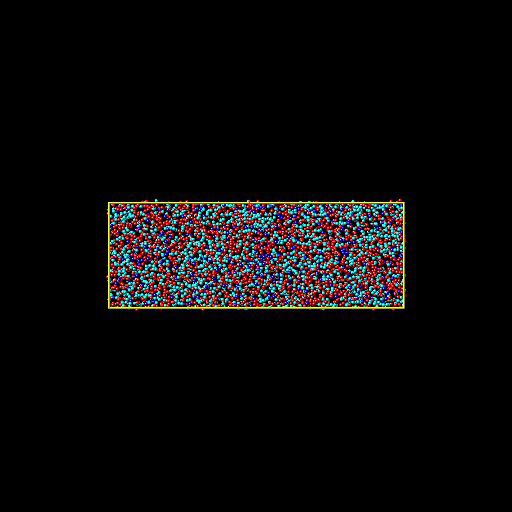

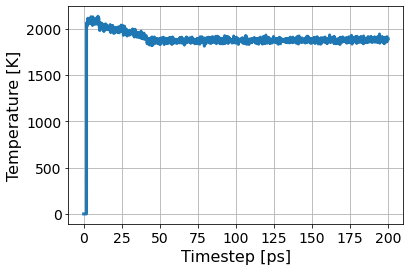

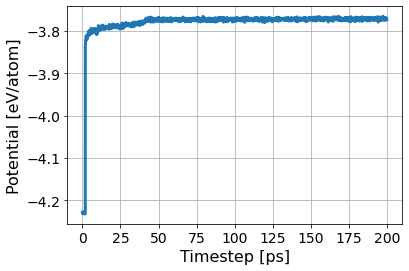

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a8aaaee17ae84b42972cfd606b919e1c/inputs.yaml
       RUNS/a8aaaee17ae84b42972cfd606b919e1c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a8aaaee17ae84b42972cfd606b919e1c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:45<00:00, 184.20s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a8aaaee17ae84b42972cfd606b919e1c/inputs.yaml
       RUNS/a8aaaee17ae84b42972cfd606b919e1c
Predicted melting temperature for this potential:  1950.2720384519348
95% confidence interval:  1.4102171954820226
Fraction of system solid:  0.3098958333333333
Fraction of system liquid:  0.6755642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1428.   43.   13.   11.    0. 3113. 4608.]


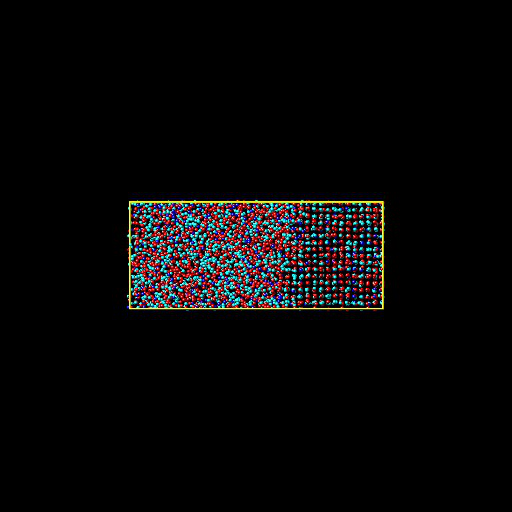

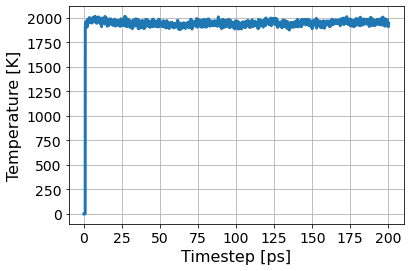

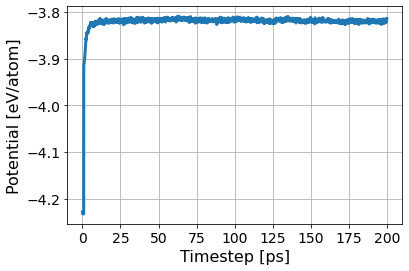

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2749a099740648e2b8a3e672f072bfb6/inputs.yaml
       RUNS/2749a099740648e2b8a3e672f072bfb6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2749a099740648e2b8a3e672f072bfb6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:17:47<00:00, 186.70s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2749a099740648e2b8a3e672f072bfb6/inputs.yaml
       RUNS/2749a099740648e2b8a3e672f072bfb6
Predicted melting temperature for this potential:  1954.4618314606744
95% confidence interval:  1.660302011769967
Fraction of system solid:  0.56640625
Fraction of system liquid:  0.4229600694444444
Simulation Success Flag 1.0
Crystal Structure Info:  [2610.   29.   13.    7.    0. 1949. 4608.]


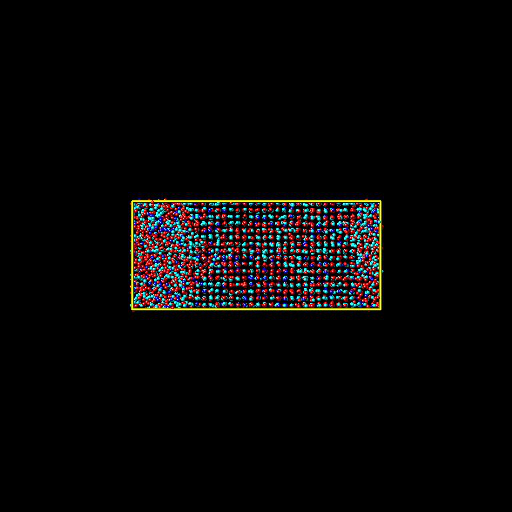

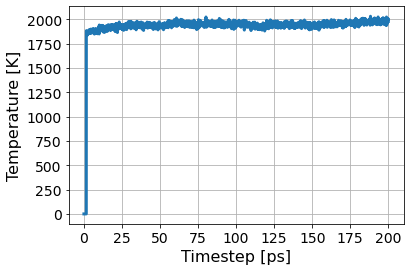

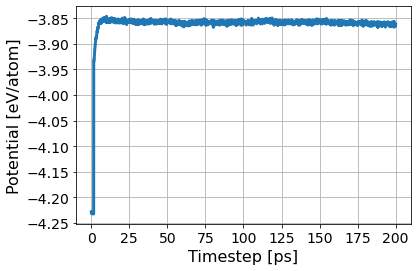

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  14
48
[0.0, 0.0, 0.3, 0.5, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5fe1da80486549ae976ae3b27d631c27/inputs.yaml
       RUNS/5fe1da80486549ae976ae3b27d631c27
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5fe1da80486549ae976ae3b27d631c27/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:14:28<00:00, 178.74s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5fe1da80486549ae976ae3b27d631c27/inputs.yaml
       RUNS/5fe1da80486549ae976ae3b27d631c27
Predicted melting temperature for this potential:  2442.912117977528
95% confidence interval:  1.6920567807094344
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9917534722222222
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.200e+01 0.000e+00 2.100e+01 3.000e+00 4.570e+03 4.608e+03]


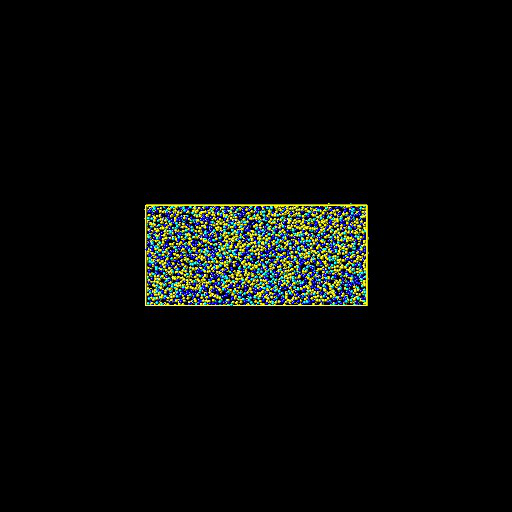

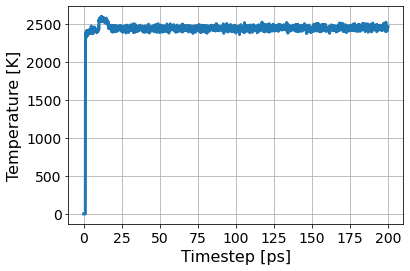

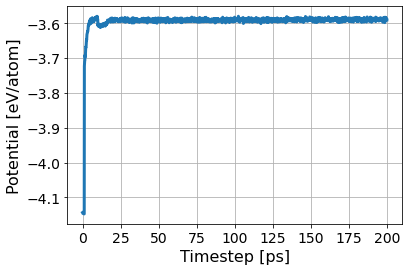

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/db107267366944008e978a7c49ed3727/inputs.yaml
       RUNS/db107267366944008e978a7c49ed3727
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/db107267366944008e978a7c49ed3727/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:14:56<00:00, 179.86s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/db107267366944008e978a7c49ed3727/inputs.yaml
       RUNS/db107267366944008e978a7c49ed3727
Predicted melting temperature for this potential:  2287.128618851436
95% confidence interval:  1.5560379296090088
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9874131944444444
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 3.300e+01 2.000e+00 1.700e+01 1.000e+00 4.550e+03 4.608e+03]


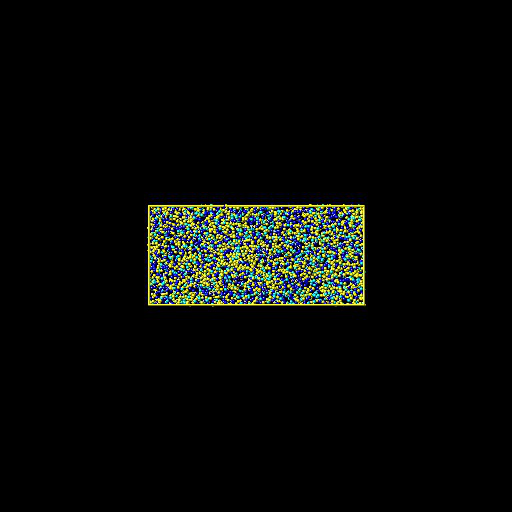

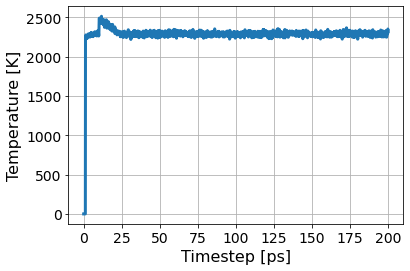

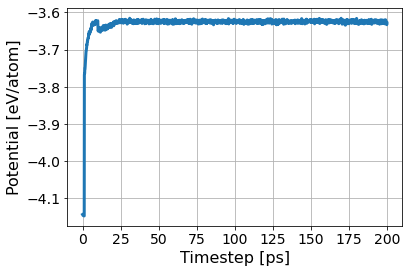

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e1f35c807df7475f9ab6cfeb08fbb15b/inputs.yaml
       RUNS/e1f35c807df7475f9ab6cfeb08fbb15b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e1f35c807df7475f9ab6cfeb08fbb15b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:15:23<00:00, 180.94s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e1f35c807df7475f9ab6cfeb08fbb15b/inputs.yaml
       RUNS/e1f35c807df7475f9ab6cfeb08fbb15b
Predicted melting temperature for this potential:  2133.5239358302124
95% confidence interval:  1.4020931066016236
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 2.900e+01 1.000e+00 3.000e+01 2.000e+00 4.544e+03 4.608e+03]


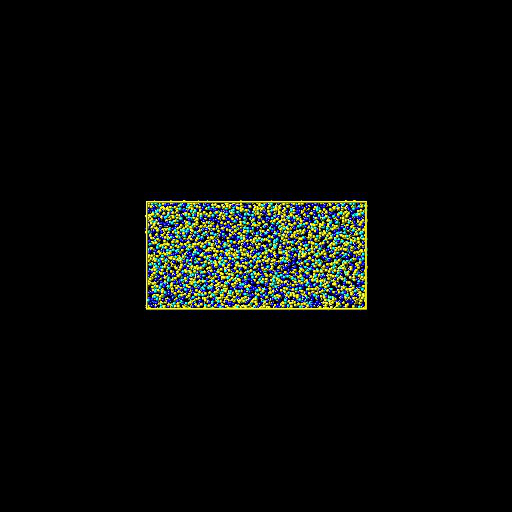

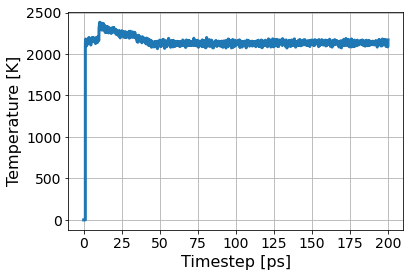

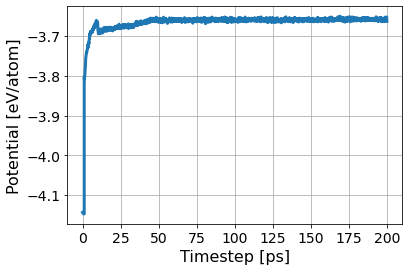

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6bea8d0b76ae4749ba28a433630b5b6e/inputs.yaml
       RUNS/6bea8d0b76ae4749ba28a433630b5b6e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6bea8d0b76ae4749ba28a433630b5b6e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:16:12<00:00, 182.91s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6bea8d0b76ae4749ba28a433630b5b6e/inputs.yaml
       RUNS/6bea8d0b76ae4749ba28a433630b5b6e
Predicted melting temperature for this potential:  2176.612867915106
95% confidence interval:  1.5181270775017397
Fraction of system solid:  0.4144965277777778
Fraction of system liquid:  0.5746527777777778
Simulation Success Flag 1.0
Crystal Structure Info:  [1910.   34.    6.   10.    0. 2648. 4608.]


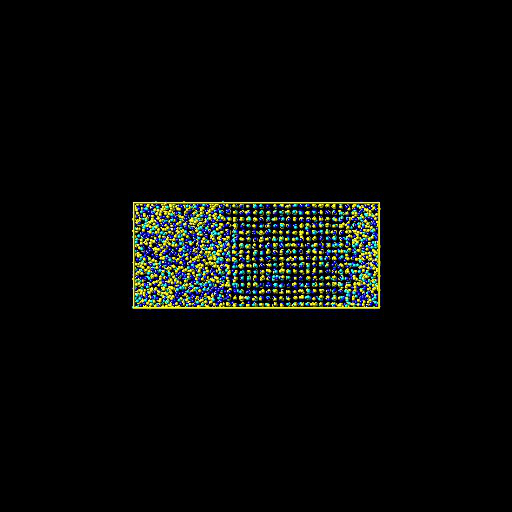

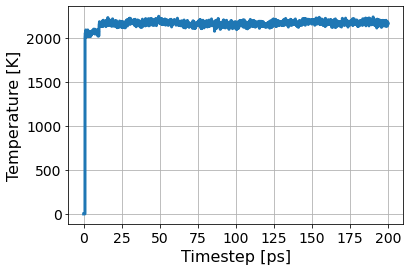

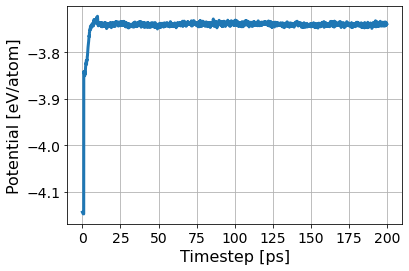

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  15
65
[0.1, 0.0, 0.2, 0.2, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/824fb51c57a44f67854e1bbc8aa11101/inputs.yaml
       RUNS/824fb51c57a44f67854e1bbc8aa11101
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/824fb51c57a44f67854e1bbc8aa11101/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:18:24<00:00, 188.19s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/824fb51c57a44f67854e1bbc8aa11101/inputs.yaml
       RUNS/824fb51c57a44f67854e1bbc8aa11101
Predicted melting temperature for this potential:  2192.5452011235957
95% confidence interval:  1.4321822944713034
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.990234375
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.100e+01 2.000e+00 2.800e+01 0.000e+00 4.563e+03 4.608e+03]


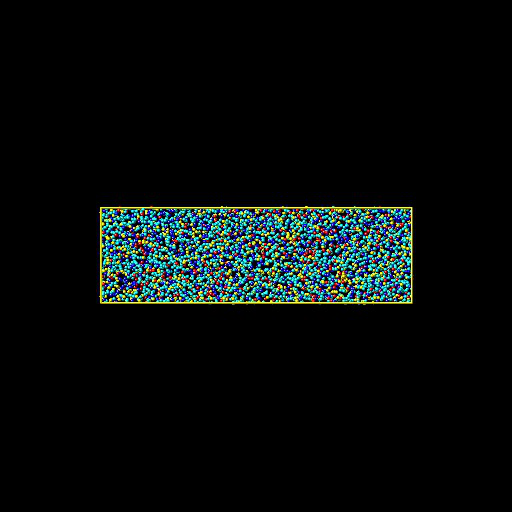

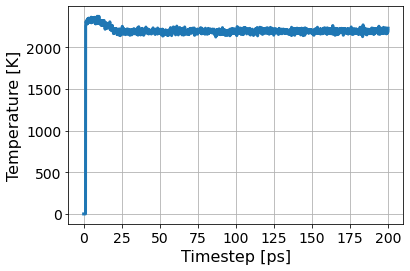

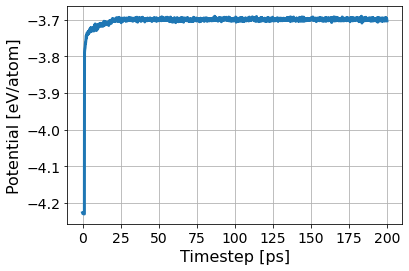

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0ddc52cf03364030ac616b9395abb098/inputs.yaml
       RUNS/0ddc52cf03364030ac616b9395abb098
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0ddc52cf03364030ac616b9395abb098/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:12<00:00, 190.12s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0ddc52cf03364030ac616b9395abb098/inputs.yaml
       RUNS/0ddc52cf03364030ac616b9395abb098
Predicted melting temperature for this potential:  2021.753049937578
95% confidence interval:  1.3531415128124202
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [   5.   19.    0.   22.    0. 4562. 4608.]


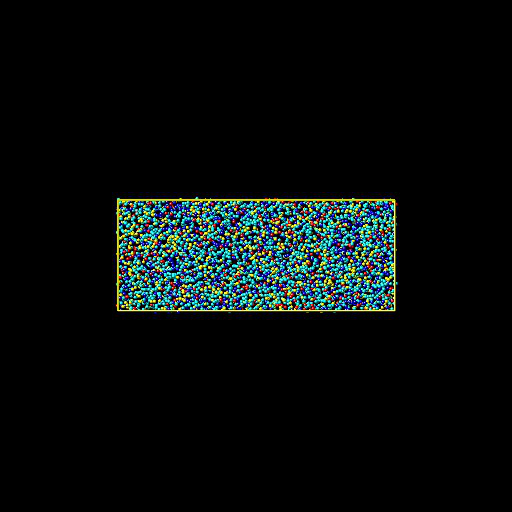

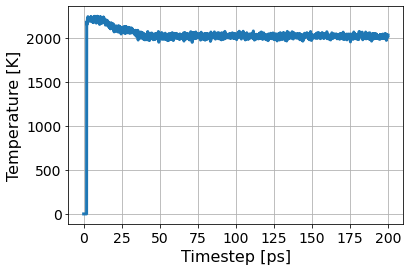

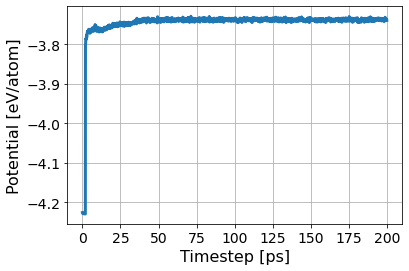

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0403f1ccf486440fbd0f7f9c23d53fa7/inputs.yaml
       RUNS/0403f1ccf486440fbd0f7f9c23d53fa7
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0403f1ccf486440fbd0f7f9c23d53fa7/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:19:48<00:00, 191.55s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0403f1ccf486440fbd0f7f9c23d53fa7/inputs.yaml
       RUNS/0403f1ccf486440fbd0f7f9c23d53fa7
Predicted melting temperature for this potential:  2102.2895946317103
95% confidence interval:  1.6333682762730157
Fraction of system solid:  0.3231336805555556
Fraction of system liquid:  0.66015625
Simulation Success Flag 0.0
Crystal Structure Info:  [1489.   42.   23.   12.    0. 3042. 4608.]


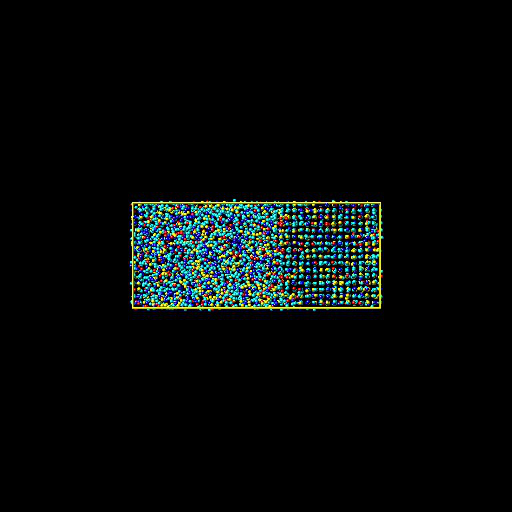

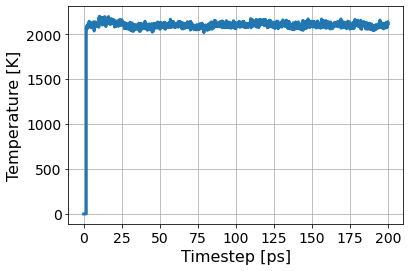

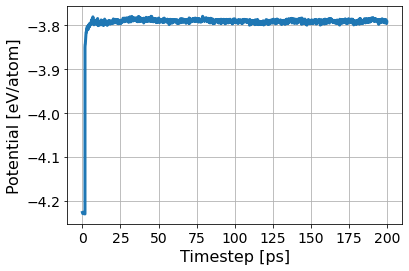

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/466f7d4a8af847569287a6d77490d526/inputs.yaml
       RUNS/466f7d4a8af847569287a6d77490d526
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/466f7d4a8af847569287a6d77490d526/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:36<00:00, 193.48s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/466f7d4a8af847569287a6d77490d526/inputs.yaml
       RUNS/466f7d4a8af847569287a6d77490d526
Predicted melting temperature for this potential:  2084.5605826466917
95% confidence interval:  1.6966528147231386
Fraction of system solid:  0.5451388888888888
Fraction of system liquid:  0.4429253472222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2.512e+03 3.800e+01 1.100e+01 5.000e+00 1.000e+00 2.041e+03 4.608e+03]


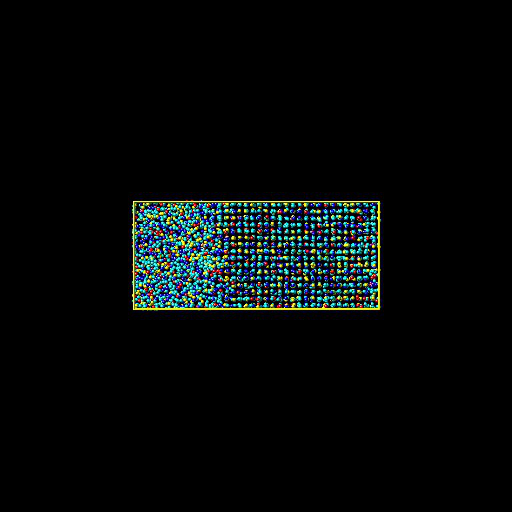

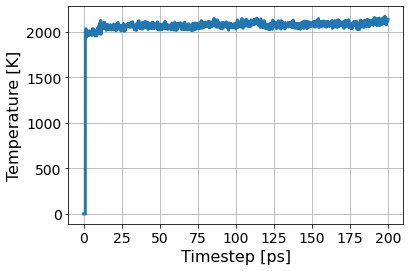

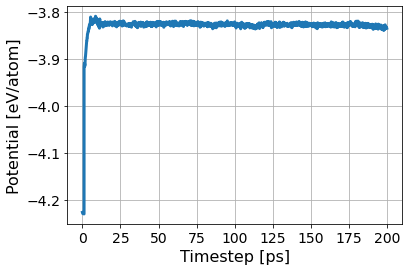

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  16
444
[0.2, 0.3, 0.2, 0.0, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/315ff75d4be44a989d0a4139a0b381c0/inputs.yaml
       RUNS/315ff75d4be44a989d0a4139a0b381c0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/315ff75d4be44a989d0a4139a0b381c0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:02<00:00, 192.09s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/315ff75d4be44a989d0a4139a0b381c0/inputs.yaml
       RUNS/315ff75d4be44a989d0a4139a0b381c0
Predicted melting temperature for this potential:  1985.6919036204747
95% confidence interval:  1.2813867194693005
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.990234375
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 2.100e+01 1.000e+00 2.100e+01 1.000e+00 4.563e+03 4.608e+03]


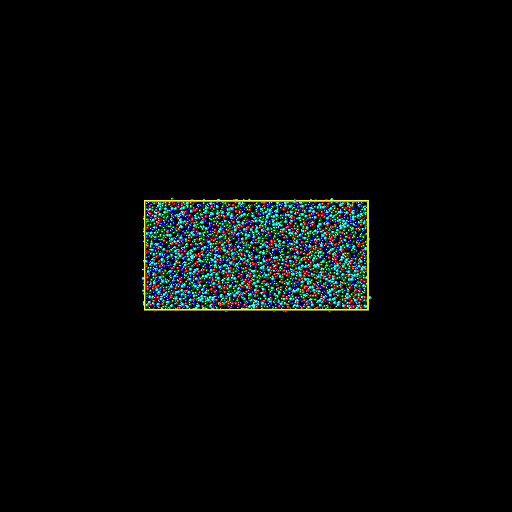

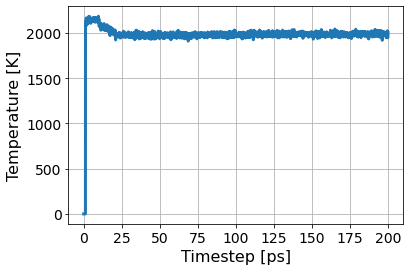

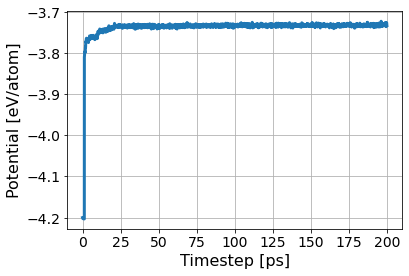

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4bb2601cec69494ba8fa0675297ce325/inputs.yaml
       RUNS/4bb2601cec69494ba8fa0675297ce325
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4bb2601cec69494ba8fa0675297ce325/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:08<00:00, 192.36s/cell]  


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4bb2601cec69494ba8fa0675297ce325/inputs.yaml
       RUNS/4bb2601cec69494ba8fa0675297ce325
Predicted melting temperature for this potential:  1860.9756263420725
95% confidence interval:  1.1827717551317405
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.986328125
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.800e+01 1.000e+00 2.900e+01 2.000e+00 4.545e+03 4.608e+03]


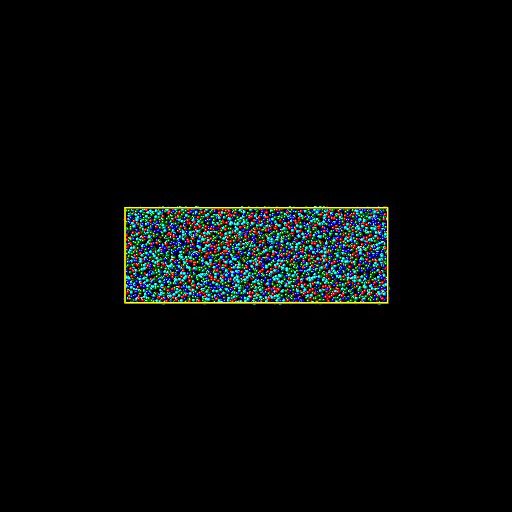

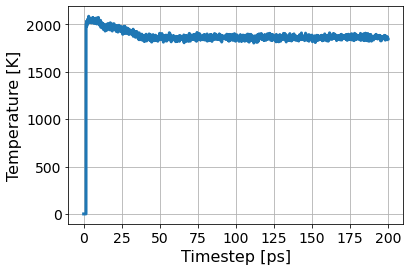

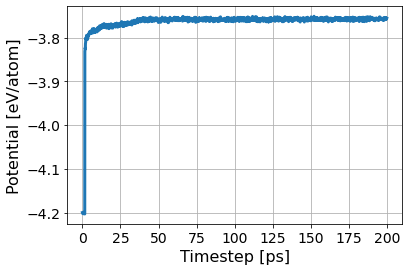

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c1b7f222860f4b9f8146cbde216fff23/inputs.yaml
       RUNS/c1b7f222860f4b9f8146cbde216fff23
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c1b7f222860f4b9f8146cbde216fff23/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [1:20:36<00:00, 193.45s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c1b7f222860f4b9f8146cbde216fff23/inputs.yaml
       RUNS/c1b7f222860f4b9f8146cbde216fff23
Predicted melting temperature for this potential:  1895.9146207240951
95% confidence interval:  1.384490019632862
Fraction of system solid:  0.2554253472222222
Fraction of system liquid:  0.7291666666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1.177e+03 3.900e+01 1.500e+01 1.600e+01 1.000e+00 3.360e+03 4.608e+03]


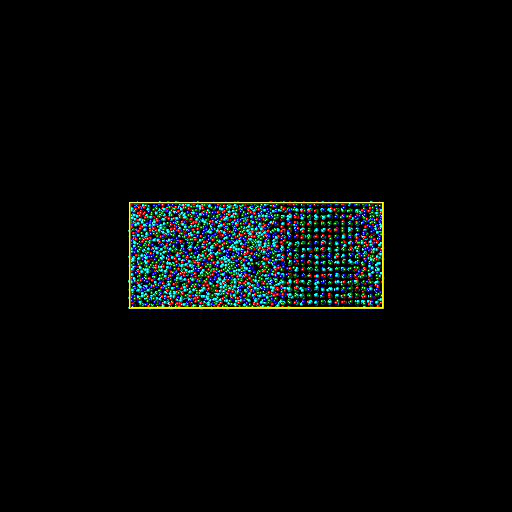

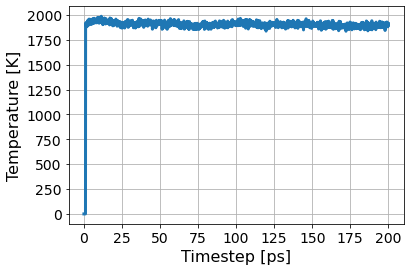

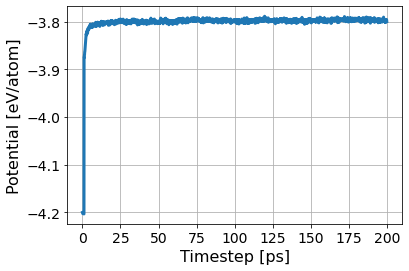

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e7a5a945fbc54d99a9d39e6558c09175/inputs.yaml
       RUNS/e7a5a945fbc54d99a9d39e6558c09175
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e7a5a945fbc54d99a9d39e6558c09175/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing:  52%|??????    | 13/25 [00:20<00:05,  2.16cell/s]

In [ ]:
n_steps = 40 #number of expirements
all_inds = set(range(len(y))) #set indexes
actaul_exp = np.sum(in_train)-len(initial_data)
gif_images = [] #list to save gifs as 2D array

history_train = [list(set(np.where(in_train)[0].tolist()))]
current_train_inds = []
#reset_comps = all_compositions.reset_index(drop=True)

#Create dataframe to save values to make into excel
saved_data = pd.DataFrame(columns=['IAF','Composition','Experiment',"Simulated Tm","Predicted Tm","Predicted Uncertainty","T_Solid","T_Liquid","Index"])
df2 = pd.DataFrame(columns = sample)

patience_counter = 0

print(len(history_train[-1]))

for i in range(n_steps):

    print("-------------------------------------------------------------")
    print("Experiment # ", i)
    
    current_train_inds = history_train[-1].copy()

    current_search_inds = list(all_inds.difference(current_train_inds))
    
    #Random Forest fitting and predicting
    model.fit(X[current_train_inds], y[current_train_inds]) #train model, with entry_number
    current_y_pred, current_y_std = model.predict(X[current_search_inds], return_std=True) #pred

    # ACQUISITION FUNCTIONS
    
    # EARLY STOPPING / ACQUISITION
    
    iaf = "MU"
    
    if iaf == "MEI":
    
        index_of_prediction = np.argmax(current_y_pred)    # MEI   
        
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    elif iaf == "UCB":
        
        index_of_prediction = np.argmax([sum(x) for x in zip(current_y_pred, current_y_std)]) # UCB     
        
        if np.max([sum(x) for x in zip(current_y_pred, current_y_std)]) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0        
    
    elif iaf == "MLI":
    
        index_of_prediction = np.argmax(np.divide(current_y_pred - np.max(y[current_train_inds]), current_y_std)) # MLI
    
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    
    elif iaf == "MU":
        
        index_of_prediction = np.argmax(current_y_std) # MU
        
        if np.max(current_y_std) < 50:
            patience_counter +=1
        else:
            patience_counter = 0
        
        
    else:
        index_of_prediction = np.random.choice(current_search_inds)           # Random    
    
#     if patience_counter > 15:
#         print("Early Stop")
#         break
        
    chosen_index_forsimul = current_search_inds[index_of_prediction]    
    composition_forsimul = all_compositions.iloc[chosen_index_forsimul] #compositions for simulation
    
    #printing index and compistion
    print(chosen_index_forsimul)
    print(list(composition_forsimul))

    # RUNNING MELTHEAS SIM

    # setting inputs
    sim_gif = []
    flag = False
    plus = 0.50
    minus = 0.25    
    iteration = 0
    
    T_ROM = current_y_pred[index_of_prediction]    
    
    while (flag == False):
        inputs = getSimToolInputs(MeltHEA)
        
        random_seed = int(np.random.randint(1,10000,1)[0])
        velocity_seed = int(np.random.randint(1,10000,1)[0])
        
        inputs.rand_seed.value = random_seed
        inputs.velocity_seed.value = velocity_seed
                
        inputs.time.value = 200000
        inputs.box_length.value = 18
        c1, c2, c3, c4, c5 = list(composition_forsimul)
        inputs.composition1.value = c1
        inputs.composition2.value = c2
        inputs.composition3.value = c3
        inputs.composition4.value = c4
        inputs.composition5.value = c5
        
        inputs.Tsolid.value = (T_ROM-(T_ROM*minus))
        inputs.Tliquid.value = (T_ROM+(T_ROM*plus))

        # running and outputs 
        r = Run(MeltHEA, inputs)

        melting_temperature_obtained = r.read('melting_temperature')
        flag = r.read('successful')
        fraction_solid = r.read('fraction_solid')
        fraction_liquid = r.read('fraction_liquid')
        sim_gif.append(r.read('final_snapshot'))

        print ("Predicted melting temperature for this potential: ", (r.read('melting_temperature')))
        print ("95% confidence interval: ", (r.read('melting_temperature_ci')))
        print ("Fraction of system solid: ", (r.read('fraction_solid')))
        print ("Fraction of system liquid: ", (r.read('fraction_liquid')))
        print ("Simulation Success Flag", (r.read('successful')))
        print ('Crystal Structure Info: ', r.read('counts_array'))
        display(r.read('final_snapshot'))

        if (flag == False):
            if fraction_solid >= fraction_liquid:
                T_ROM += T_ROM*.05 #~80
            elif fraction_liquid >= fraction_solid:
                T_ROM -= T_ROM*.05 #~80
                
         #Graph from the melting workflow
        import matplotlib.pyplot as plt
        #Total number of atoms for 8x8 BCC unit cell cross-section and user input box-length
        if inputs.crystal_structure.value == 'bcc':
            atom_count = 8*8*2*inputs.box_length.value

        #Total number of atoms for 8x8 FCC unit cell cross-section and user input box-length
        elif inputs.crystal_structure.value == 'fcc':
            atom_count = 8*8*4*inputs.box_length.value

        ts = r.read('time_series')

        temperature = r.read('temperature_series')
        plt.plot((ts/1000),temperature,linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Temperature [K]',fontsize=16)
        plt.grid()
        plt.show()

        potential_energy = r.read('potential_energy_series')
        plt.plot((ts/1000),np.divide(potential_energy,atom_count),linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Potential [eV/atom]',fontsize=16)
        plt.grid()
        plt.show() 

    y[chosen_index_forsimul] = melting_temperature_obtained
    
    #Ending when desired temp found
    if melting_temperature_obtained > 2600:
        continue

    current_train_inds.append(chosen_index_forsimul) #from inputs choosing untrained indexes randomly
    history_train.append(current_train_inds) #storage list, of sets of values created throughout sequential learning
    
    composition_string = " ".join([i + ' ' + str(j) for i, j in zip(["Cr","Co","Cu","Fe","Ni"], composition_forsimul)])
    
    T_Solid = inputs.Tsolid.value
    T_Liquid = inputs.Tliquid.value
    
    
    #Creating dataframe for Animation
    data = pd.DataFrame([iaf,composition_string, actaul_exp, melting_temperature_obtained, current_y_pred[index_of_prediction],
                         current_y_std[index_of_prediction], T_Solid, T_Liquid,chosen_index_forsimul, random_seed, velocity_seed])
    data = data.T
    data = data.rename(columns = {0:'IAF', 1:'Composition',2:'Experiment',3: "Simulated Tm",4: "Predicted Tm",5:"Predicted Uncertainty",6:"T_Solid",7:"T_Liquid",8:"Index", 9:"RandomSeed", 10:"VelocitySeed"})
    saved_data = saved_data.append(data)
    actaul_exp = actaul_exp + 1
    
    #Saving Information into file
    files_to_saved_data = saved_data
    if list_seq_learn:
        files_to_saved_data = saved_data.append(seq_learn_data)
    files_to_saved_data = files_to_saved_data.sort_values(by='Experiment')
    
    csv_file_name2 = '{0}_melting_8labels50pico{1}.csv'.format(iaf,len(list_seq_learn))
    files_to_saved_data.to_csv(csv_file_name2, index = False)
    
    #Getting Images for Gif
    gif_images.append(sim_gif)
    

In [ ]:
display(saved_data)

# Save Runs Into CSV

In [ ]:
if list_seq_learn:
    saved_data = saved_data.append(seq_learn_data)
saved_data = saved_data.sort_values(by='Experiment')
display(saved_data)

In [ ]:
csv_file_name2 = '{0}_melting_8labels200pico{1}.csv'.format(iaf,len(list_seq_learn))
saved_data.to_csv(csv_file_name2, index = False)